In [1]:
import sys
import time
%pylab inline
%load_ext autoreload
%autoreload 2
sys.path.append('../..')
import omama as O
import tensorflow as tf
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.callbacks import EarlyStopping
from tqdm.notebook import tqdm
import cv2
import os
from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, BatchNormalization, Activation
from tensorflow.keras.models import Model

Populating the interactive namespace from numpy and matplotlib


In [2]:
img_height = 512
img_width = 512
batch_size = 32

In [3]:
train_image_folder = '/hpcstor6/scratch01/r/ryan.zurrin001/omama_2d/2d_512_small/train/images'
train_mask_folder = '/hpcstor6/scratch01/r/ryan.zurrin001/omama_2d/2d_512_small/train/masks'

test_image_folder = '/hpcstor6/scratch01/r/ryan.zurrin001/omama_2d/2d_512_small/test/images'
test_mask_folder = '/hpcstor6/scratch01/r/ryan.zurrin001/omama_2d/2d_512_small/test/masks'

In [4]:
def custom_data_generator(image_folder, mask_folder, batch_size, img_height, img_width):
    image_files = sorted([f for f in os.listdir(image_folder) if f.endswith('.npz')])
    mask_files = sorted([f for f in os.listdir(mask_folder) if f.endswith('_mask.npz')])
    
    total_files = len(image_files)
    
    while True:  # Loop forever so the generator never terminates
        for i in tqdm(range(0, total_files, batch_size)):
            batch_image_files = image_files[i:i+batch_size]
            batch_mask_files = mask_files[i:i+batch_size]
            
            batch_images = []
            batch_masks = []
            
            for img_file, mask_file in zip(batch_image_files, batch_mask_files):
                # Load image
                with np.load(os.path.join(image_folder, img_file)) as data:
                    image = data['data']
                image = np.resize(image, (img_height, img_width, 1))  # Resizing the image array
                image = image / 255.0  # Rescale
                
                # Load mask
                with np.load(os.path.join(mask_folder, mask_file)) as data:
                    mask = data['data']
                mask = np.resize(mask, (img_height, img_width, 1))  # Resizing the mask array
                
                batch_images.append(image)
                batch_masks.append(mask)
            
            yield (np.array(batch_images), np.array(batch_masks))


In [5]:
# Custom callback for tqdm progress bar update
class TQDMProgressBar(Callback):
    def __init__(self):
        super().__init__()
        self.progress_bar = None

    def on_train_begin(self, logs=None):
        total = self.params.get('steps', 0) * self.params.get('epochs', 0)
        self.progress_bar = tqdm(total=total, position=0, desc='Training', leave=True)

    def on_batch_end(self, batch, logs=None):
        self.progress_bar.update(1)
        self.progress_bar.set_postfix(logs, refresh=True)

    def on_train_end(self, logs=None):
        self.progress_bar.close()
        self.progress_bar = None


In [6]:
def build_unet(input_shape):
    inputs = Input(input_shape)

    # Encoder
    c1 = Conv2D(32, (3, 3), padding='same')(inputs)
    c1 = Activation('relu')(BatchNormalization()(c1))
    c1 = Conv2D(32, (3, 3), padding='same')(c1)
    c1 = Activation('relu')(BatchNormalization()(c1))
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(64, (3, 3), padding='same')(p1)
    c2 = Activation('relu')(BatchNormalization()(c2))
    c2 = Conv2D(64, (3, 3), padding='same')(c2)
    c2 = Activation('relu')(BatchNormalization()(c2))
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(128, (3, 3), padding='same')(p2)
    c3 = Activation('relu')(BatchNormalization()(c3))
    c3 = Conv2D(128, (3, 3), padding='same')(c3)
    c3 = Activation('relu')(BatchNormalization()(c3))
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = Conv2D(256, (3, 3), padding='same')(p3)
    c4 = Activation('relu')(BatchNormalization()(c4))
    c4 = Conv2D(256, (3, 3), padding='same')(c4)
    c4 = Activation('relu')(BatchNormalization()(c4))
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)

    # Middle
    c5 = Conv2D(512, (3, 3), padding='same')(p4)
    c5 = Activation('relu')(BatchNormalization()(c5))
    c5 = Conv2D(512, (3, 3), padding='same')(c5)
    c5 = Activation('relu')(BatchNormalization()(c5))

    # Decoder
    u6 = UpSampling2D((2, 2))(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(256, (3, 3), padding='same')(u6)
    c6 = Activation('relu')(BatchNormalization()(c6))
    c6 = Conv2D(256, (3, 3), padding='same')(c6)
    c6 = Activation('relu')(BatchNormalization()(c6))

    u7 = UpSampling2D((2, 2))(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(128, (3, 3), padding='same')(u7)
    c7 = Activation('relu')(BatchNormalization()(c7))
    c7 = Conv2D(128, (3, 3), padding='same')(c7)
    c7 = Activation('relu')(BatchNormalization()(c7))

    u8 = UpSampling2D((2, 2))(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(64, (3, 3), padding='same')(u8)
    c8 = Activation('relu')(BatchNormalization()(c8))
    c8 = Conv2D(64, (3, 3), padding='same')(c8)
    c8 = Activation('relu')(BatchNormalization()(c8))

    u9 = UpSampling2D((2, 2))(c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(32, (3, 3), padding='same')(u9)
    c9 = Activation('relu')(BatchNormalization()(c9))
    c9 = Conv2D(32, (3, 3), padding='same')(c9)
    c9 = Activation('relu')(BatchNormalization()(c9))

    c10 = Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = Model(inputs=inputs, outputs=c10)
    return model

In [7]:
# Create generators
train_generator = custom_data_generator(train_image_folder, train_mask_folder, batch_size, img_height, img_width)
image_files = sorted([f for f in os.listdir(train_image_folder) if f.endswith('.npz')])
steps_per_epoch = len(image_files) // batch_size

# Compile and train model
model = build_unet((img_height, img_width, 1))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Initialize tqdm callback
tqdm_callback = TQDMProgressBar()

# Initialize EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',    # Change this to 'loss' if you don't have a validation set
    min_delta=0.001,       # The minimum change to qualify as an improvement
    patience=3,           # How many epochs to wait before stopping
    restore_best_weights=True, # This will keep the best weights once stopped
    verbose=1              # To print the log of when the training stops
)

In [8]:
history = model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=50,
    verbose=0,  # Suppress default verbose output
    callbacks=[tqdm_callback, early_stopping]
)

  0%|          | 0/250 [00:00<?, ?it/s]

Training:   0%|          | 0/12500 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

In [9]:
test_generator = custom_data_generator(test_image_folder, test_mask_folder, batch_size, img_height, img_width)

In [10]:
# Close all tqdm instances
for instance in list(tqdm._instances): 
    instance.close()
    tqdm._instances.clear()

In [11]:
# Get the number of test samples
test_image_files = sorted([f for f in os.listdir(test_image_folder) if f.endswith('.npz')])
print(len(test_image_files))
test_steps = len(test_image_files) // batch_size
print(test_steps)
# Initialize a list to store all predictions
all_predictions = []

# Create and update a single tqdm progress bar
with tqdm(total=test_steps) as pbar:
    for i in range(test_steps):
        batch_data, _ = next(test_generator)  # Ignoring the labels
        predictions = model.predict(batch_data, verbose=0)
        all_predictions.append(predictions)
        pbar.update(1)

2000
62


  0%|          | 0/62 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

In [12]:
thresholded_predictions = (predictions > 0.5).astype('uint8')

In [13]:
len(thresholded_predictions)

32

In [14]:
def get_and_draw_bounding_boxes(mask, original_image, min_area=100):  # Added min_area parameter
    # Make sure mask is of type uint8
    _, thresh = cv2.threshold(mask, 40, 255, 0)
    
    # Finding contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    # Initialize variables to keep track of the largest contour
    max_area = 0
    largest_contour = None
    
    # Loop through all contours to find the largest one that's above min_area
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area > max_area and area > min_area:  # Added area > min_area condition
            max_area = area
            largest_contour = cnt
    
    # If a contour exists, draw the bounding box
    if largest_contour is not None:
        x, y, w, h = cv2.boundingRect(largest_contour)
        cv2.rectangle(original_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
    
    return original_image


In [15]:
test_generator = custom_data_generator(test_image_folder, test_mask_folder, batch_size, img_height, img_width)

  0%|                                                                                                         …

  0%|          | 0/63 [00:00<?, ?it/s]

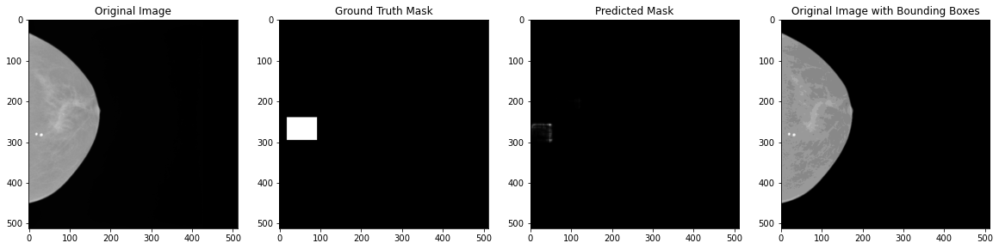

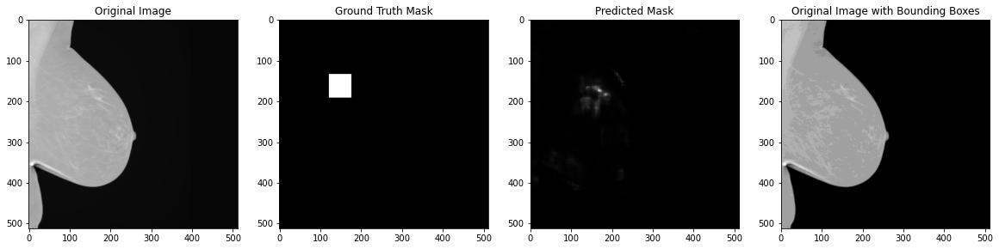

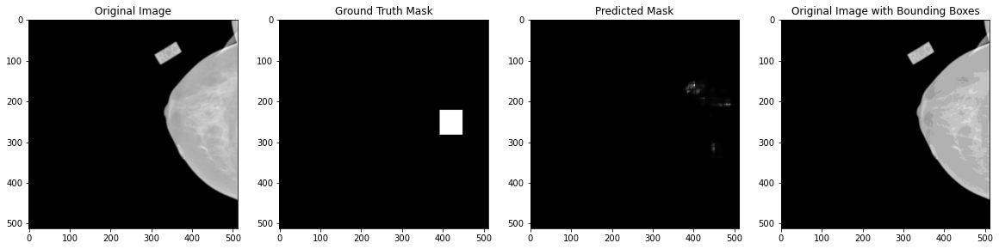

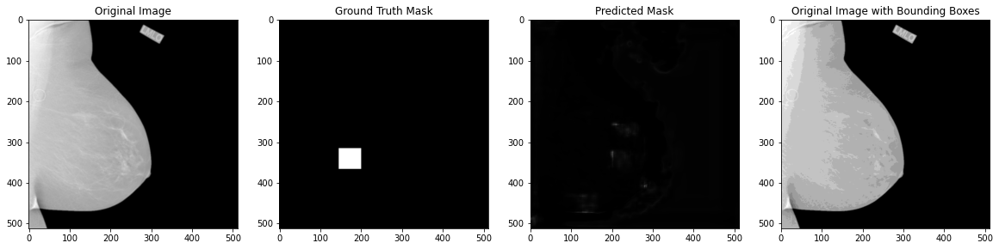

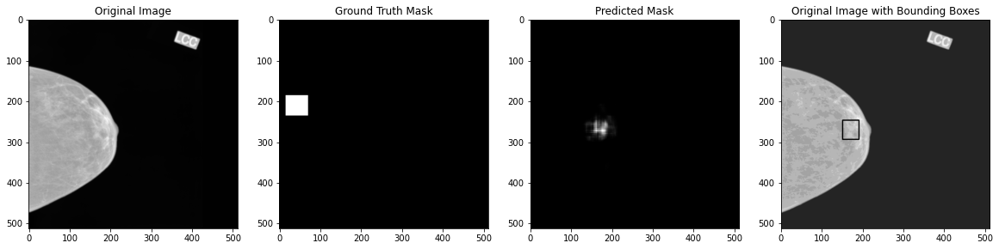

...

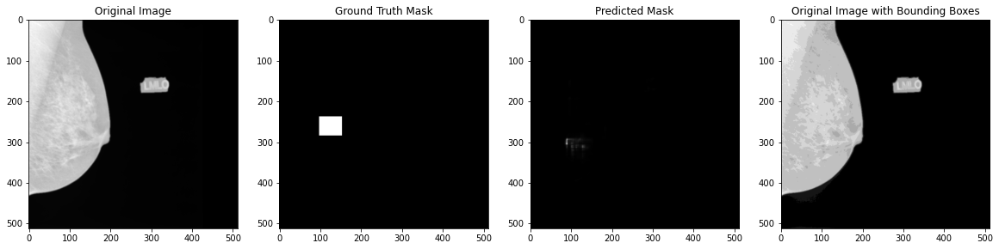

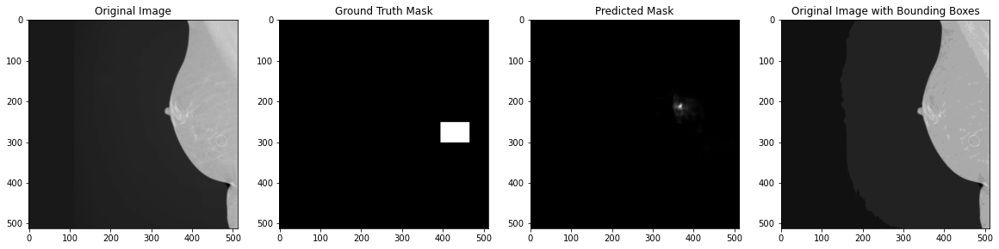

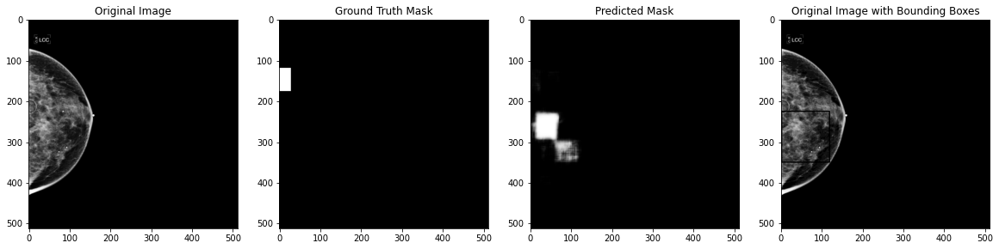

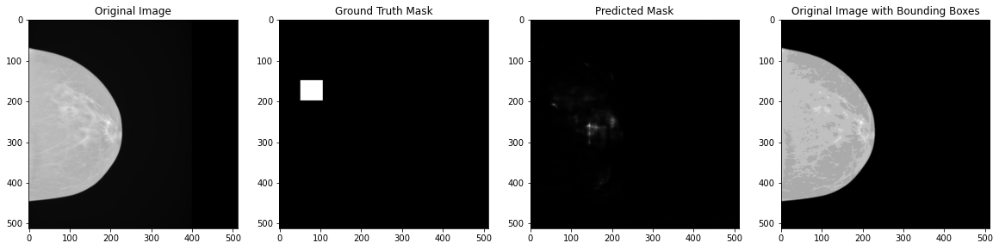

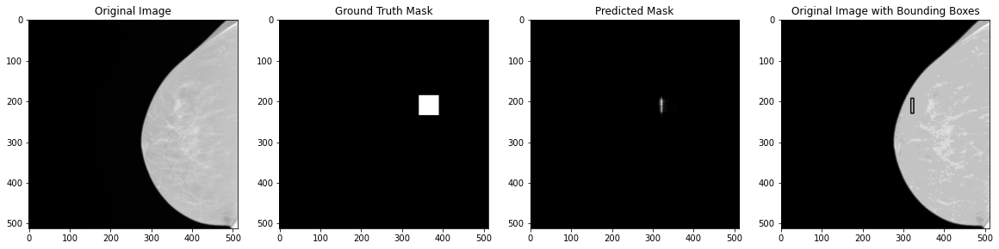

  0%|          | 0/63 [00:00<?, ?it/s]

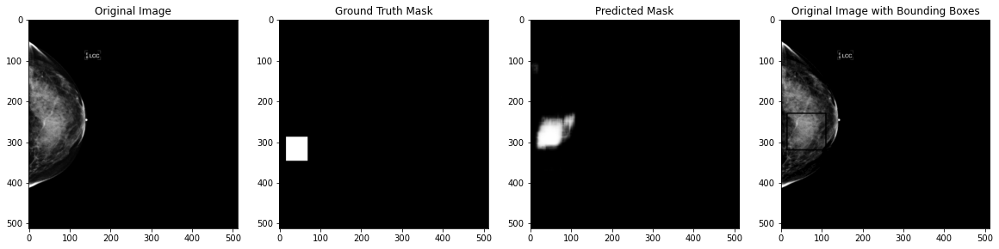

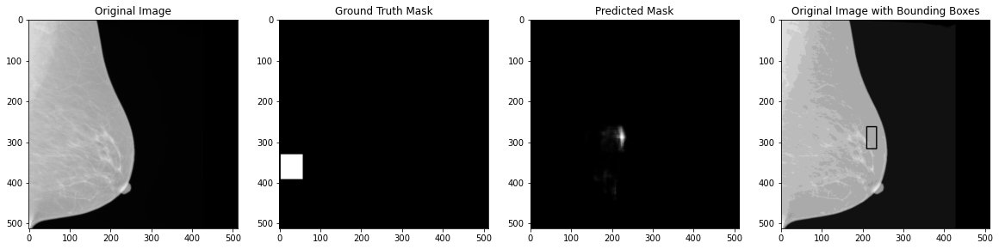

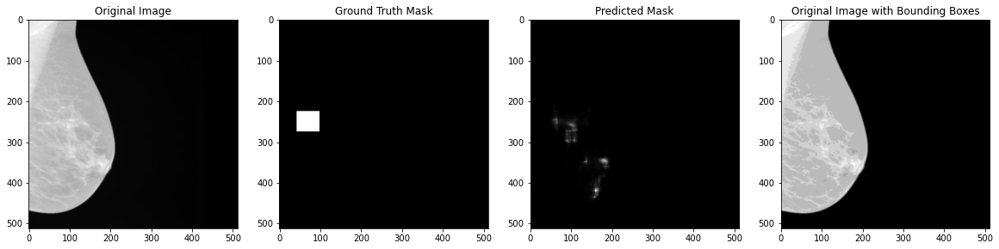

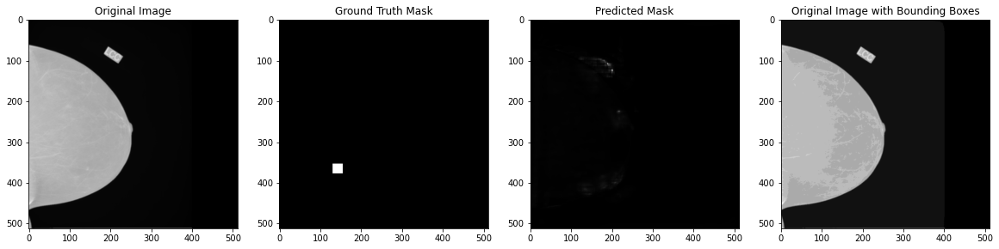

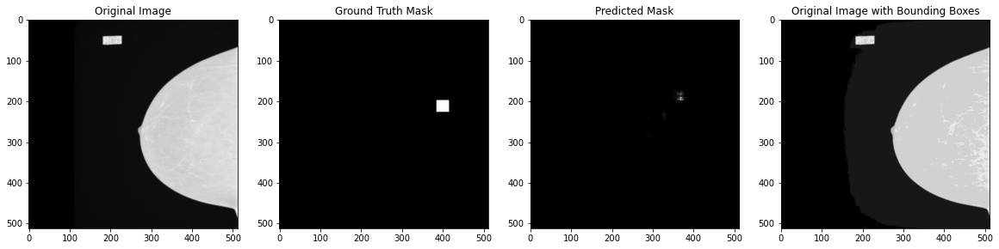

...

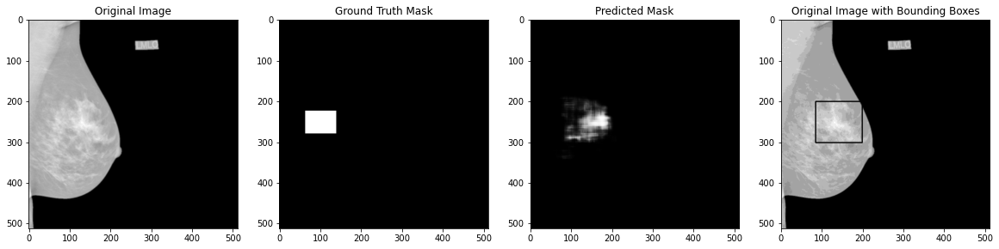

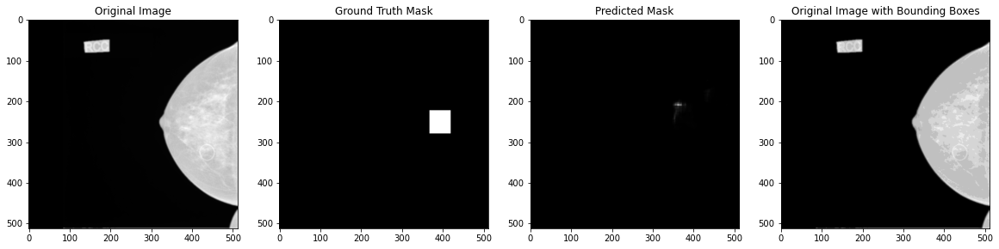

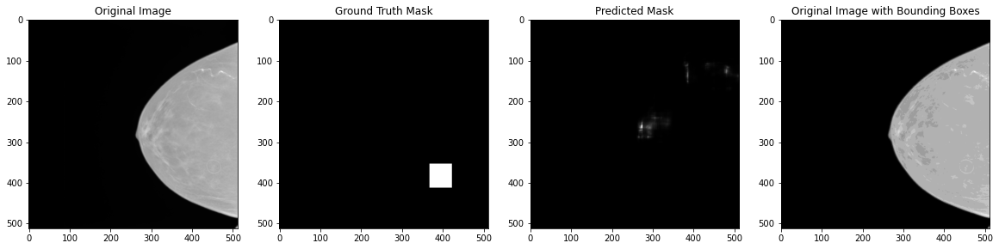

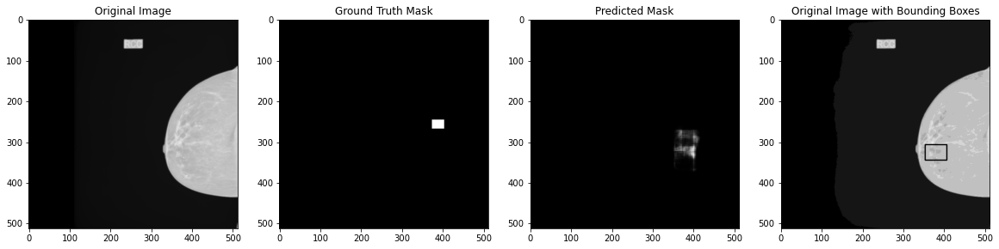

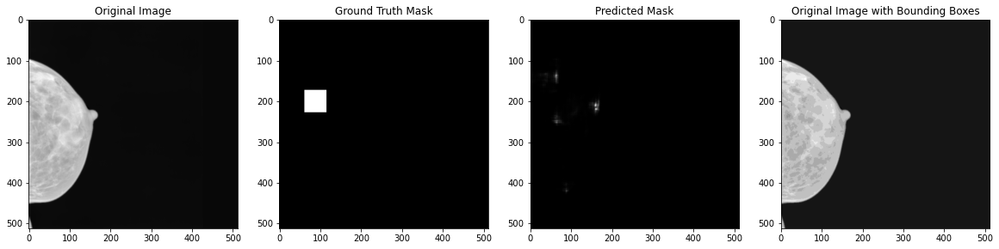

  0%|          | 0/63 [00:00<?, ?it/s]

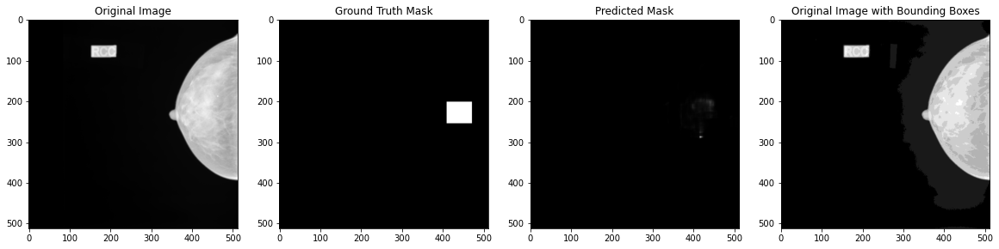

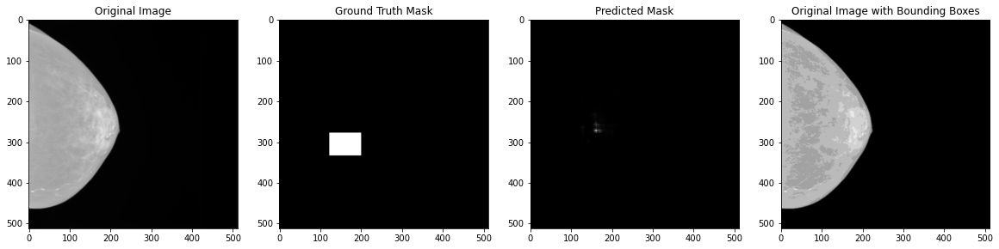

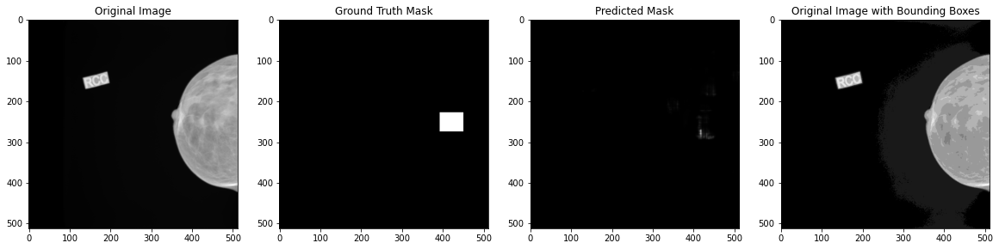

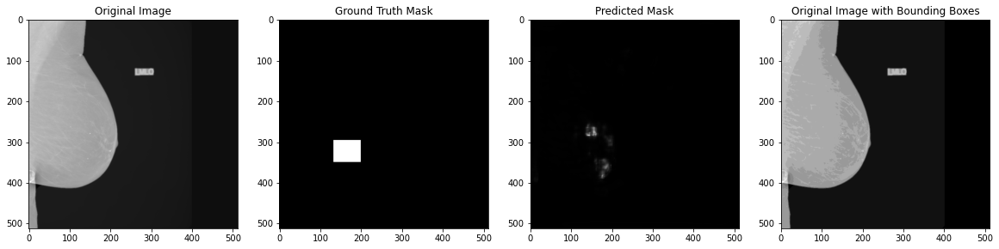

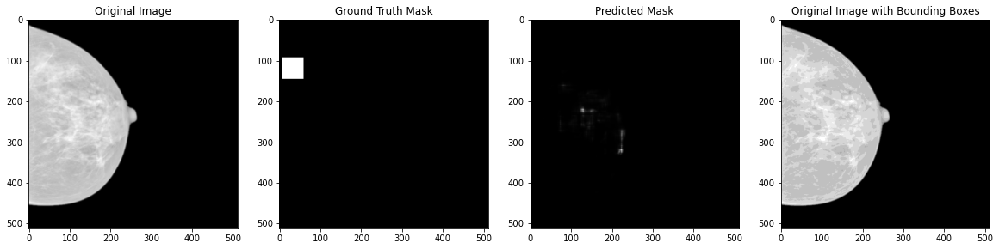

...

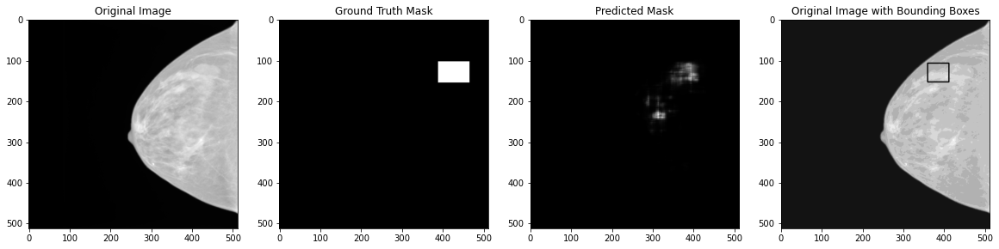

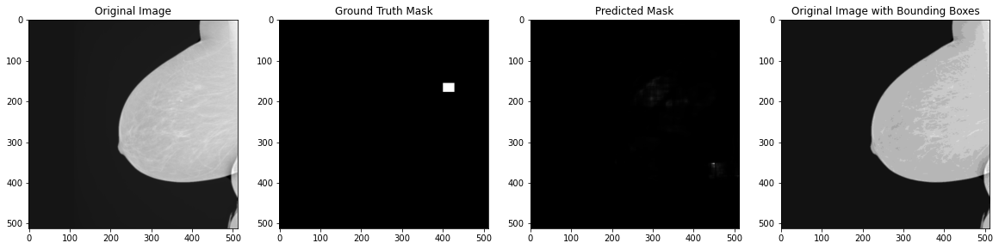

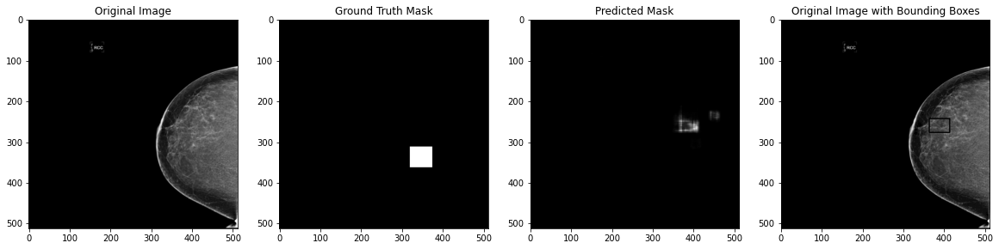

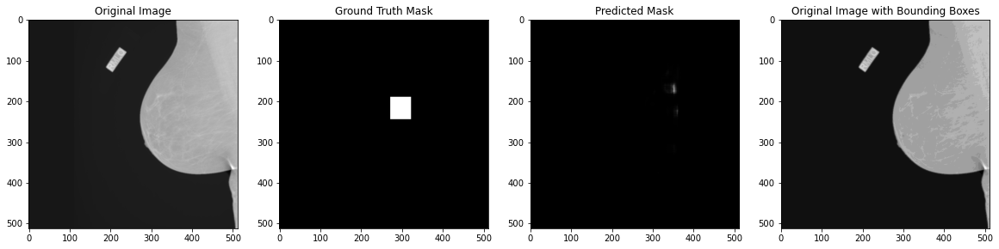

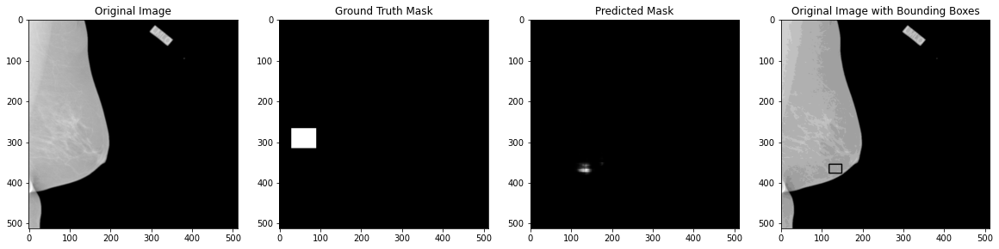

  0%|          | 0/63 [00:00<?, ?it/s]

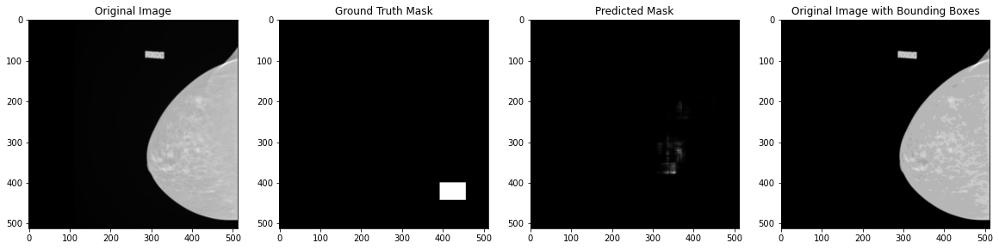

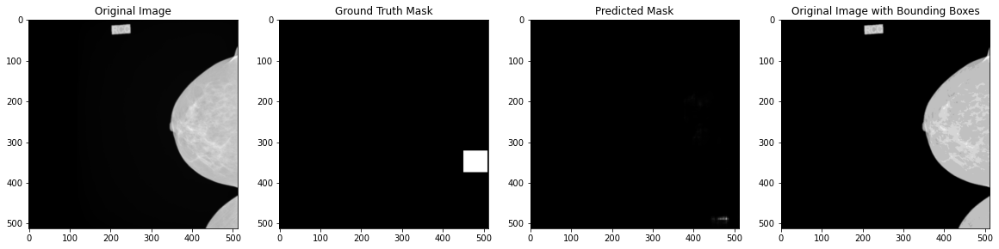

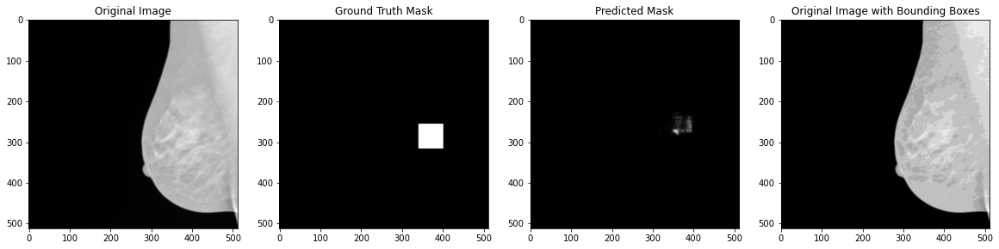

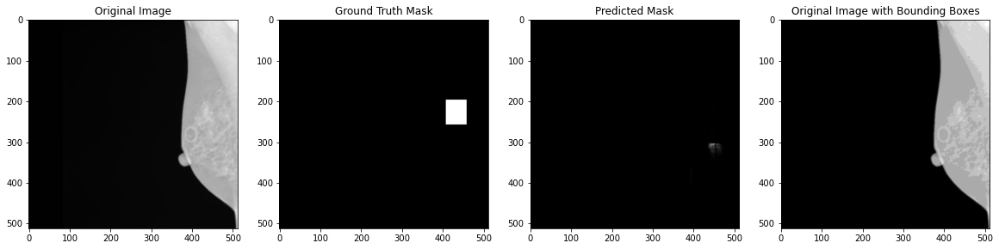

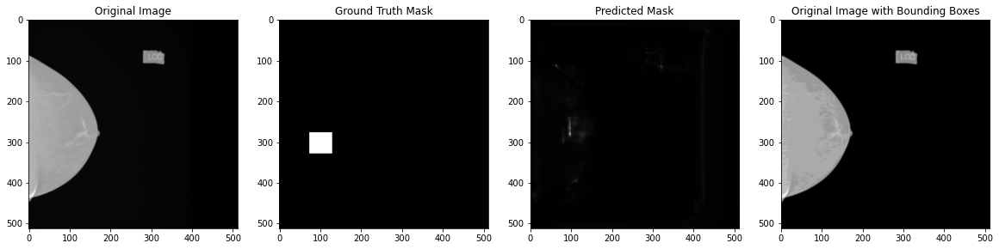

...

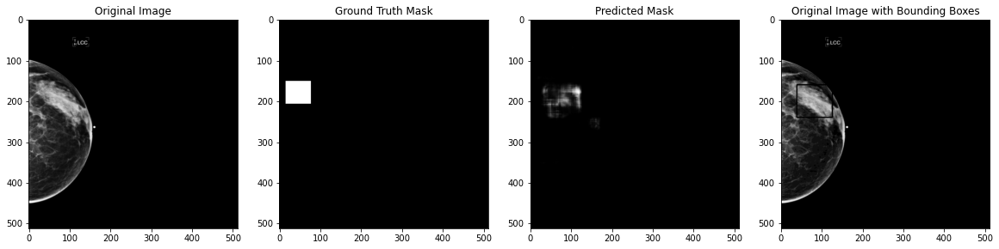

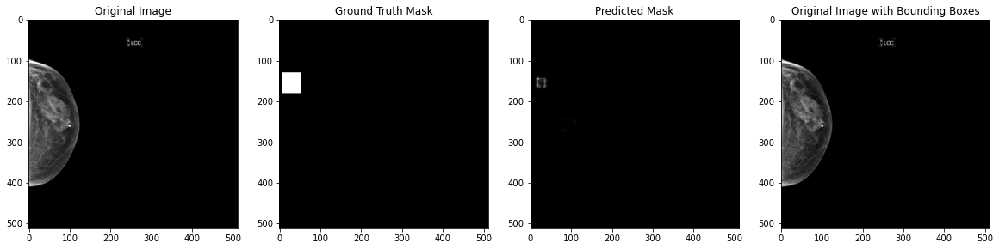

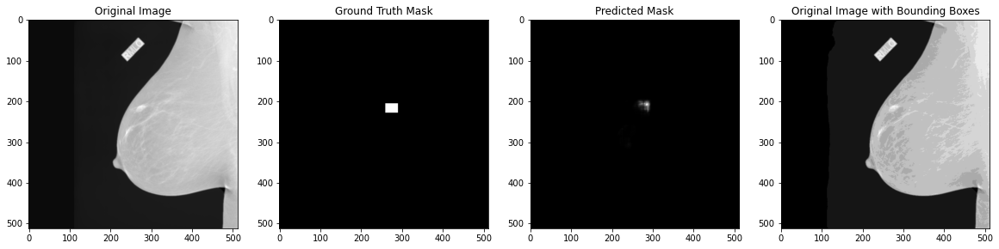

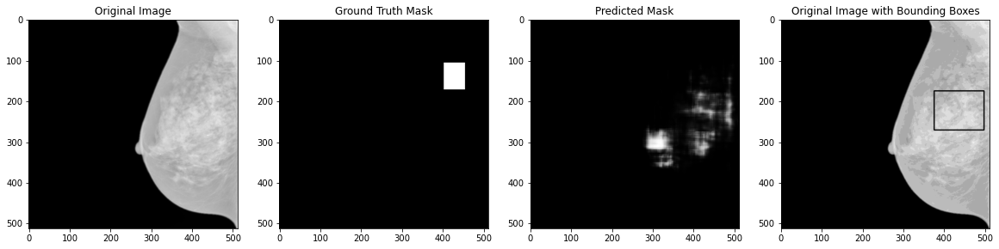

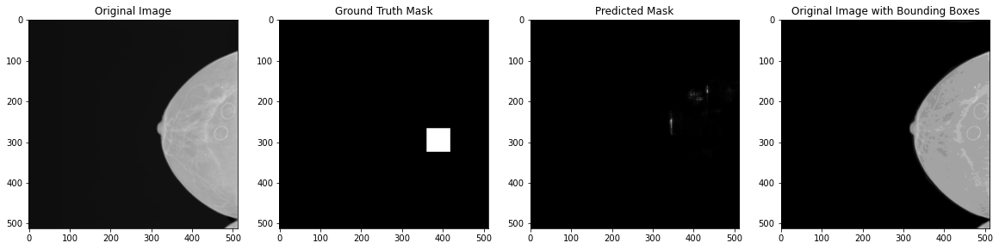

  0%|          | 0/63 [00:00<?, ?it/s]

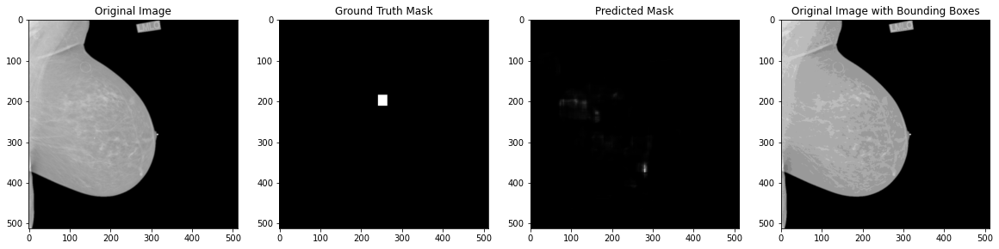

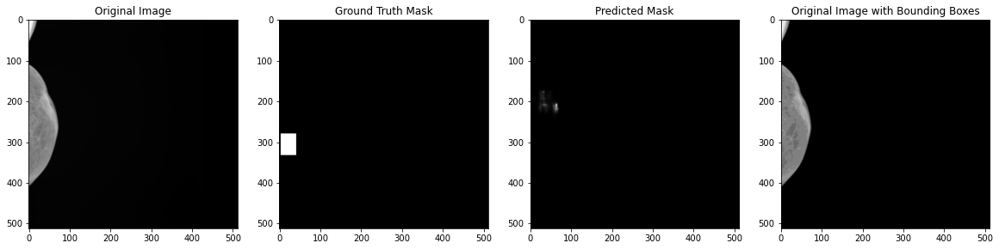

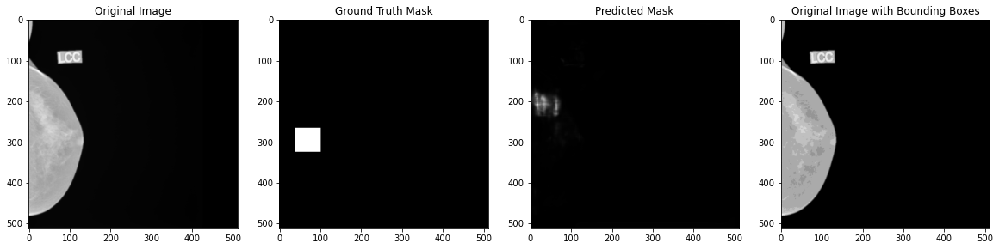

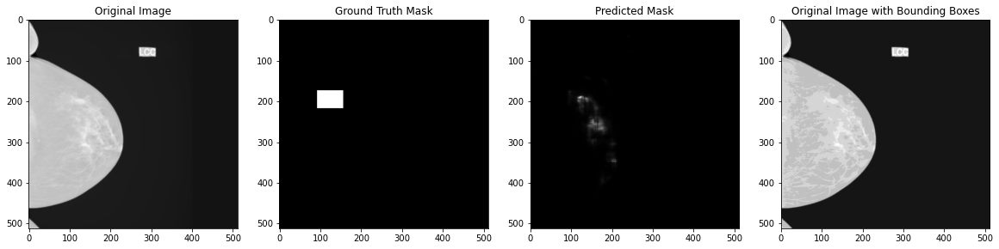

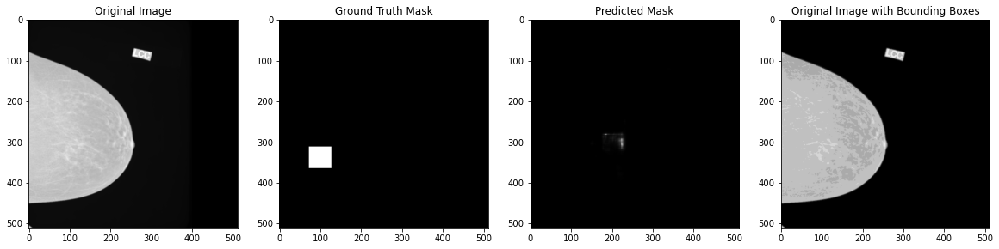

...

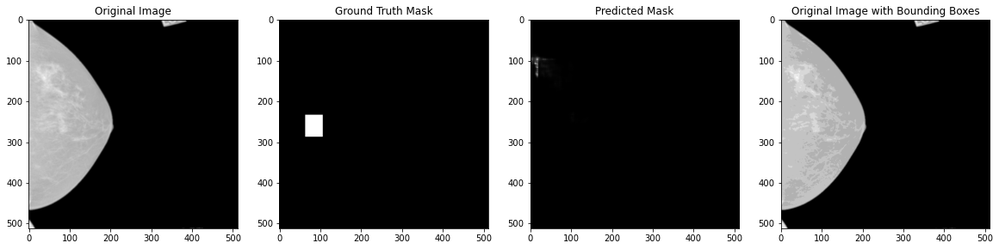

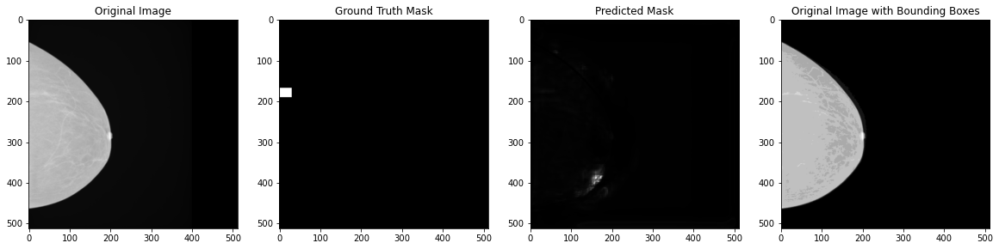

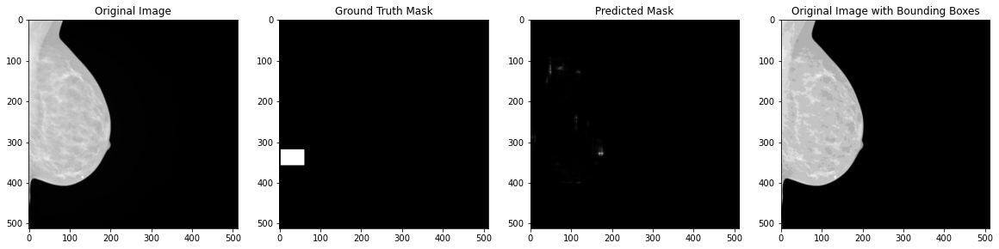

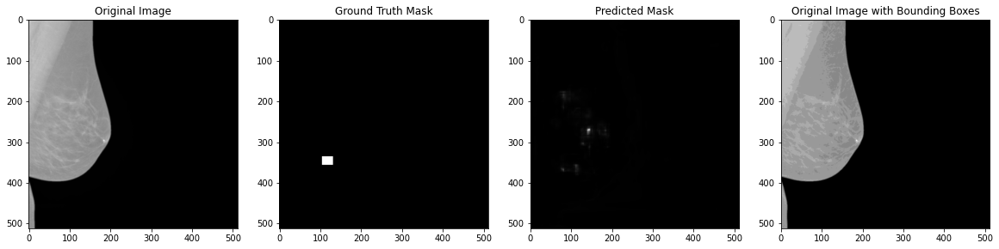

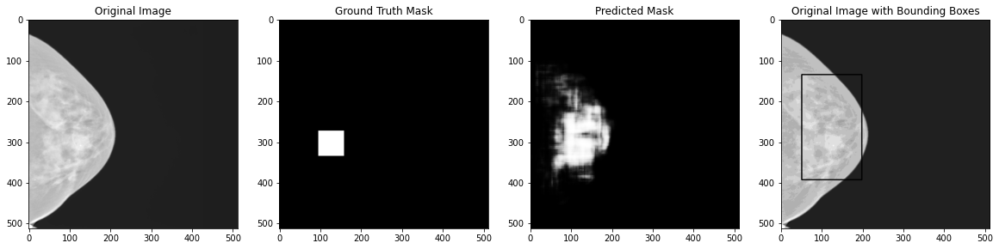

  0%|          | 0/63 [00:00<?, ?it/s]

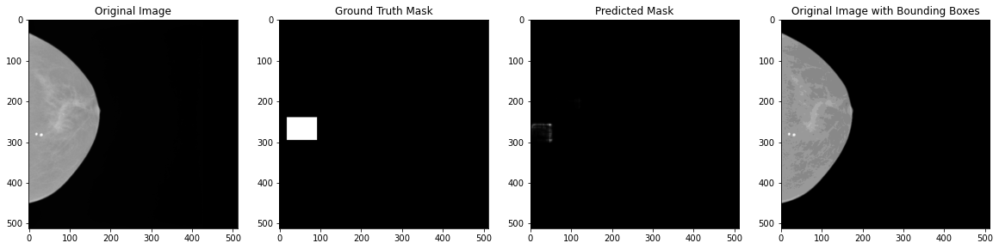

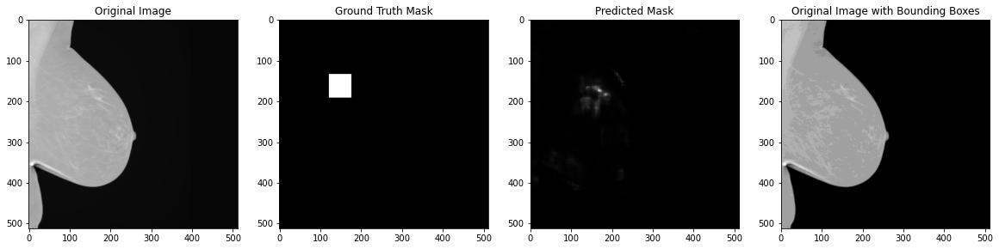

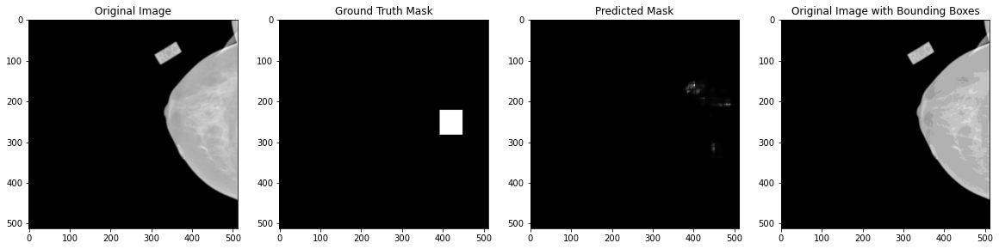

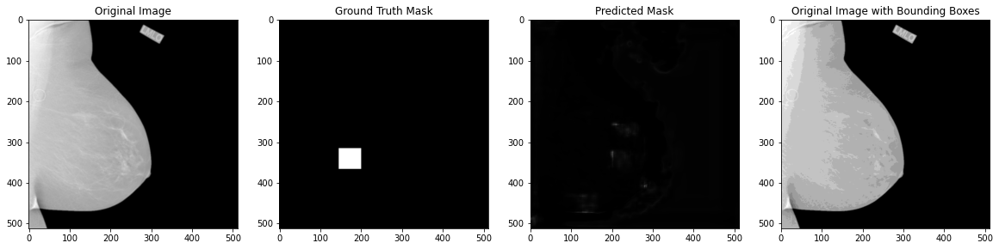

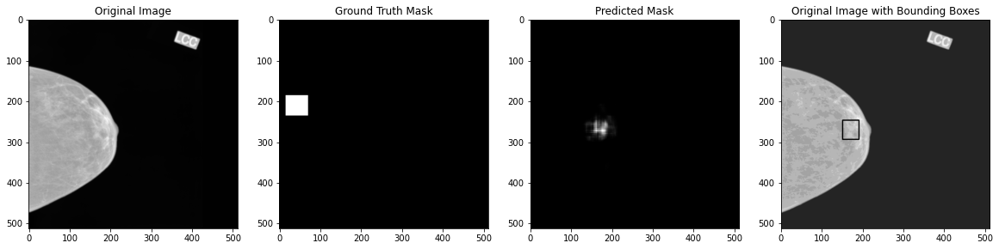

...

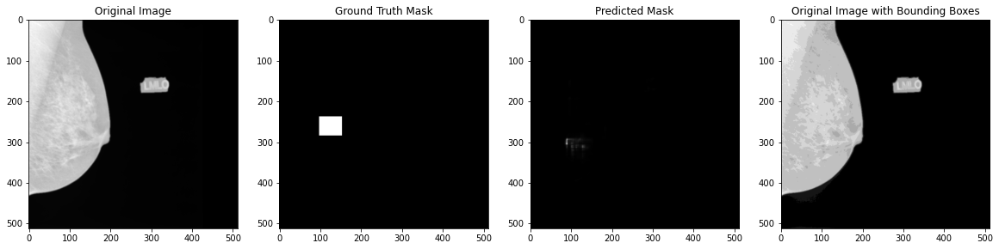

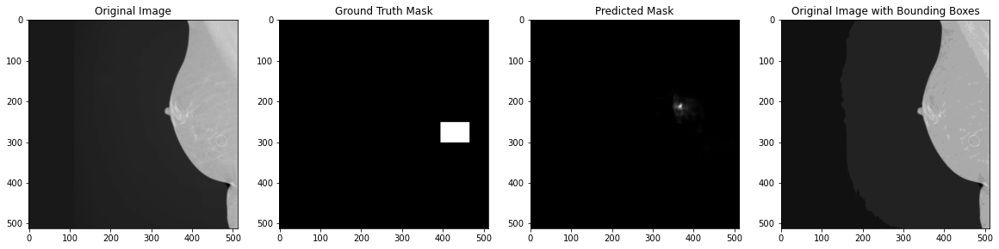

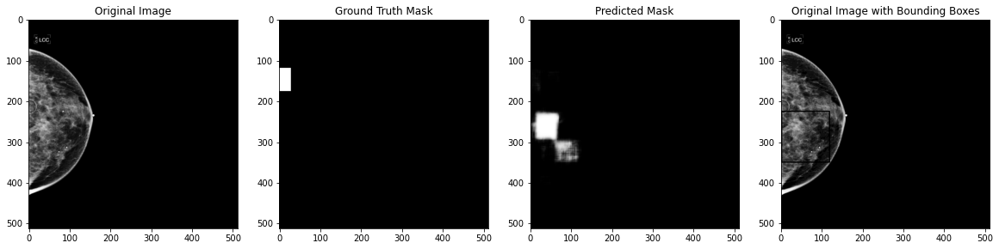

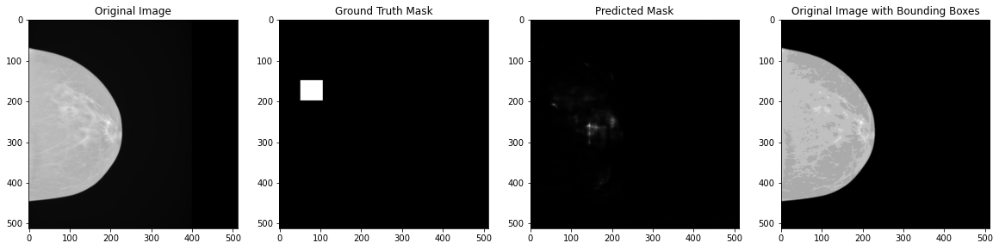

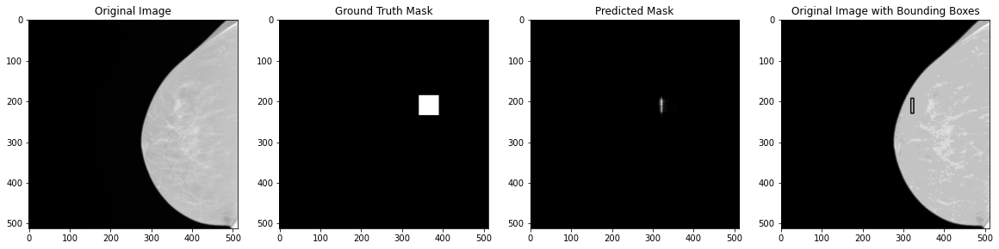

  0%|          | 0/63 [00:00<?, ?it/s]

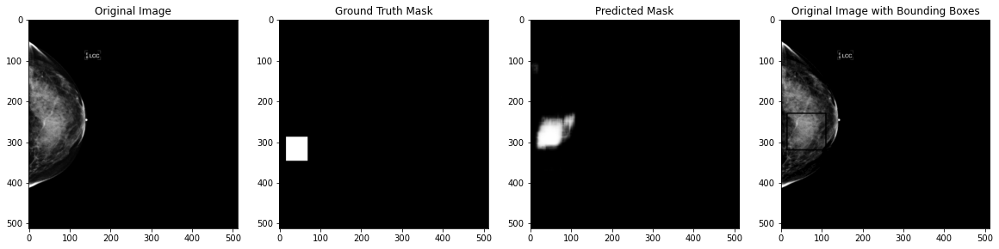

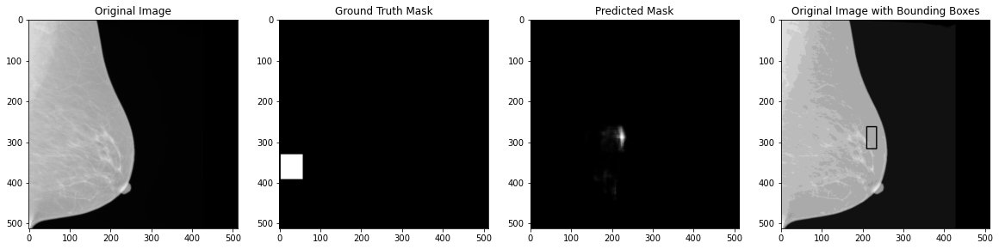

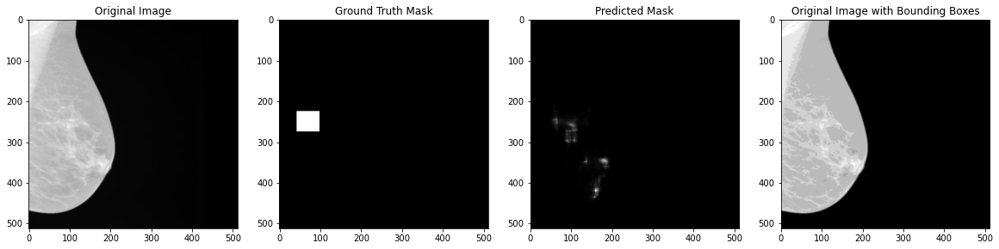

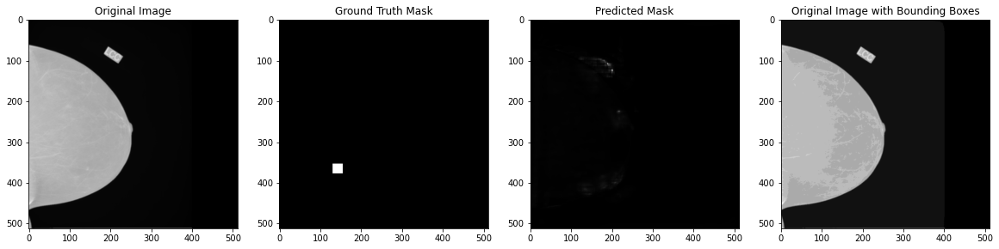

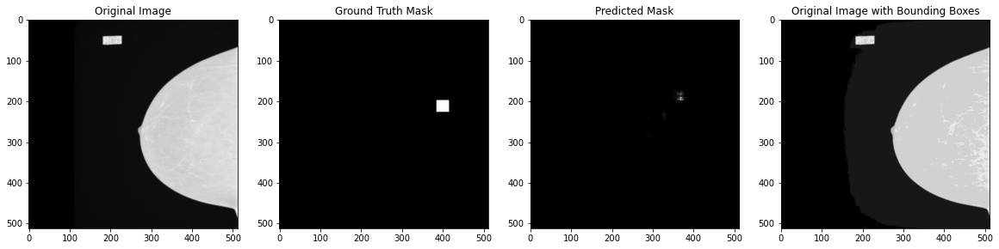

...

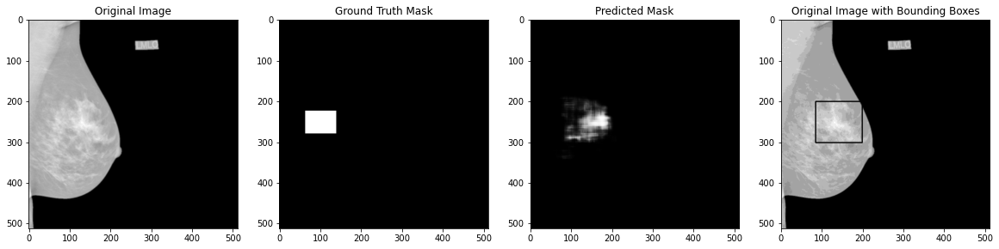

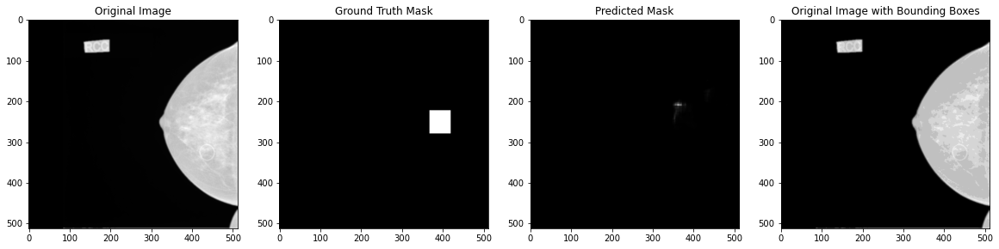

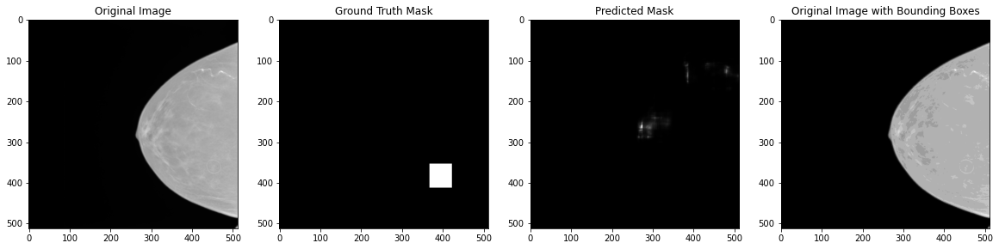

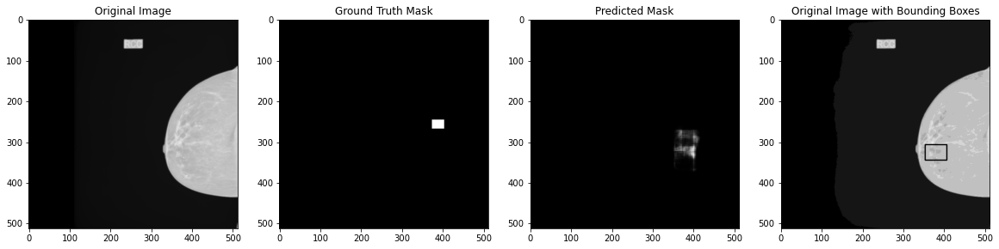

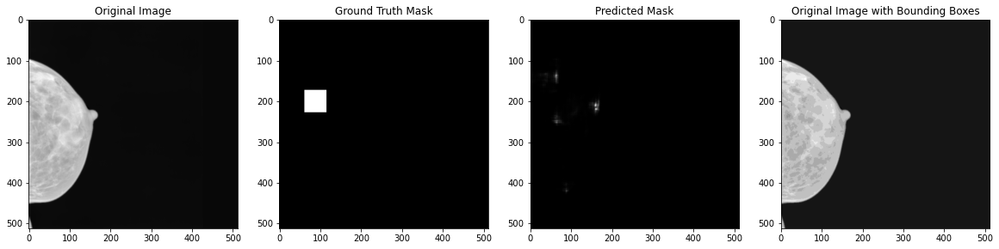

  0%|          | 0/63 [00:00<?, ?it/s]

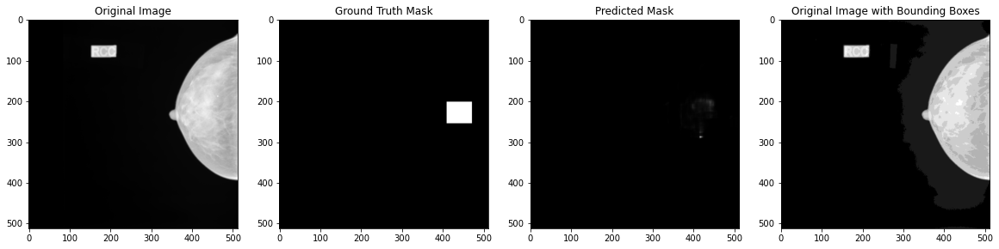

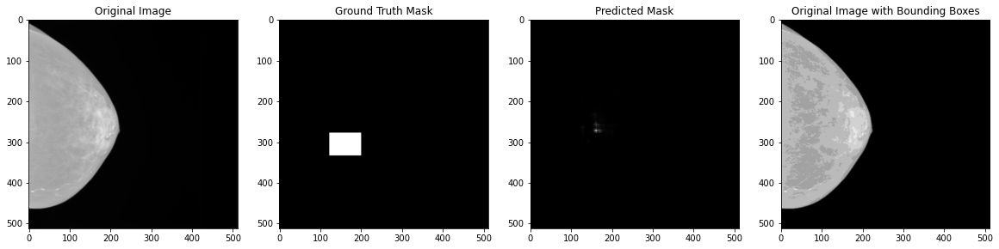

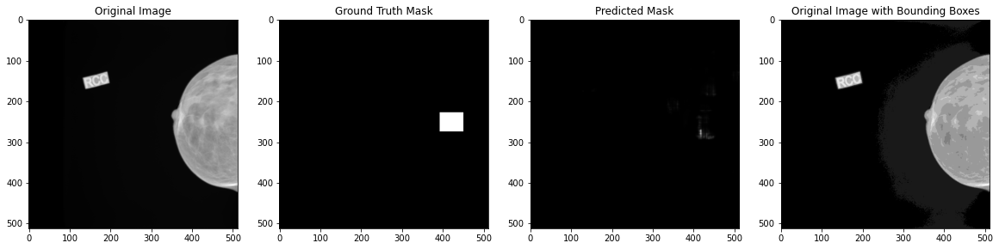

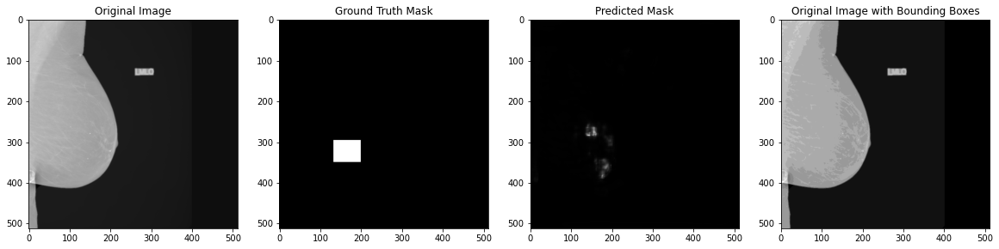

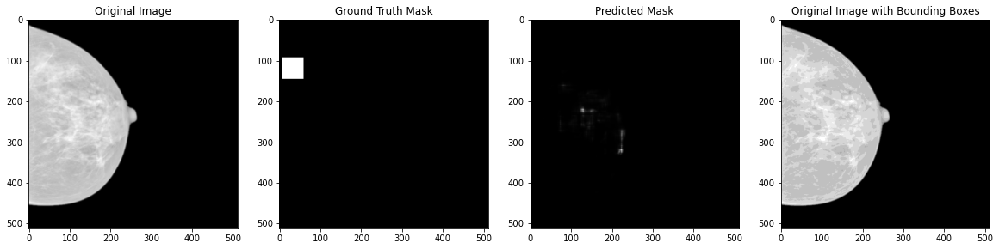

...

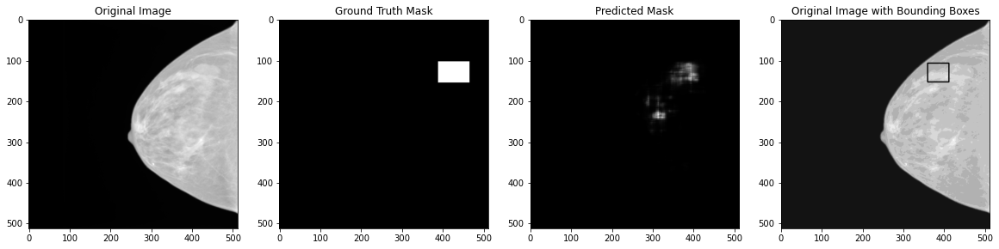

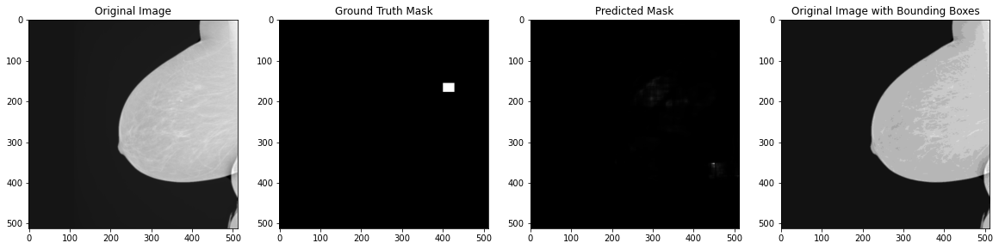

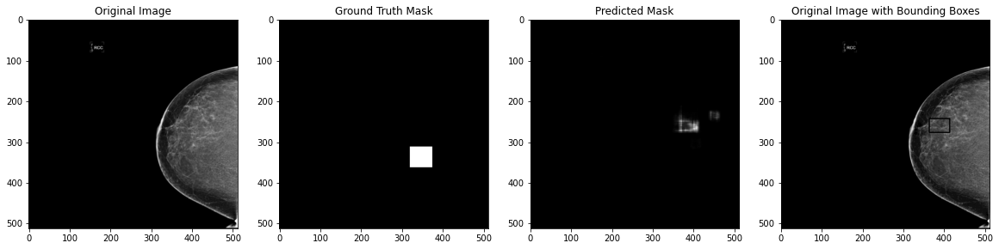

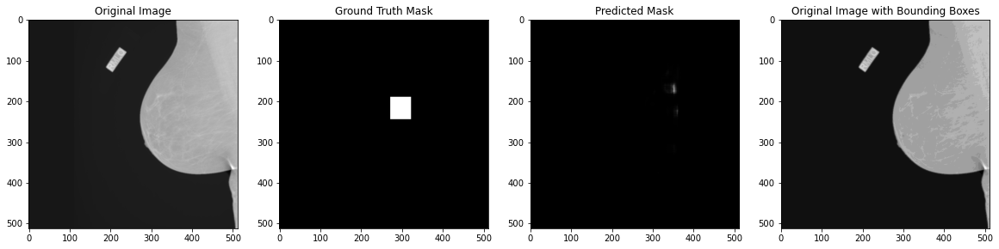

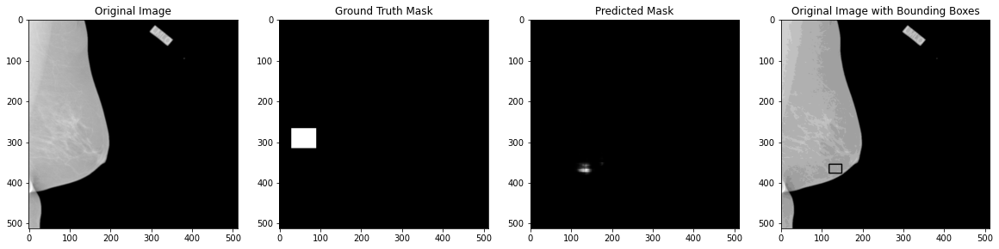

  0%|          | 0/63 [00:00<?, ?it/s]

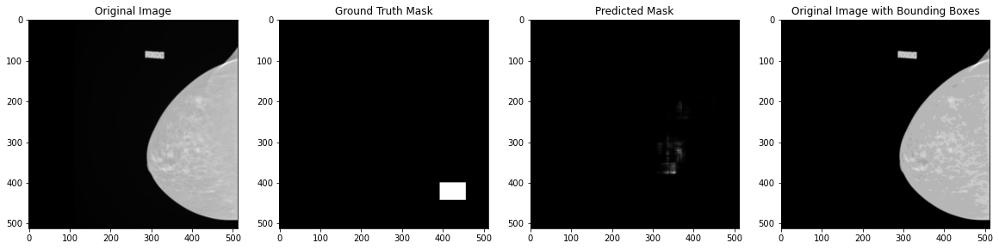

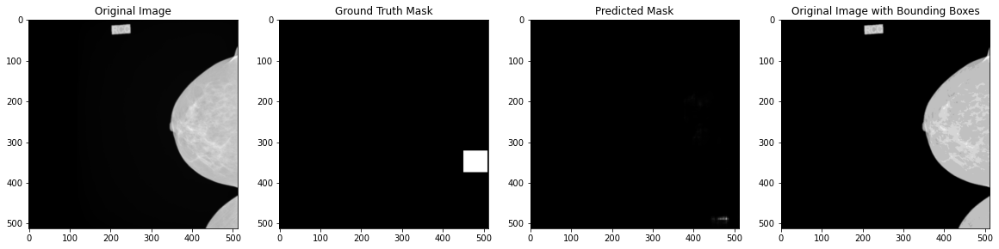

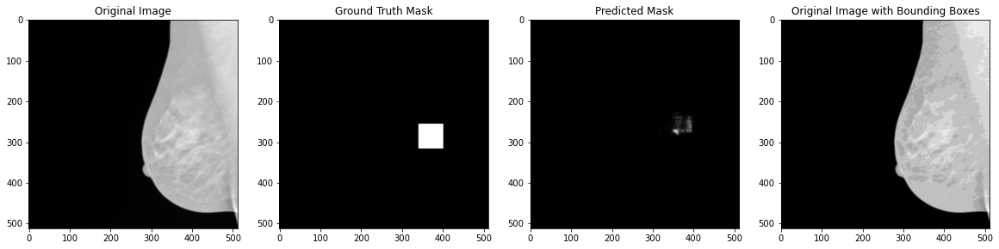

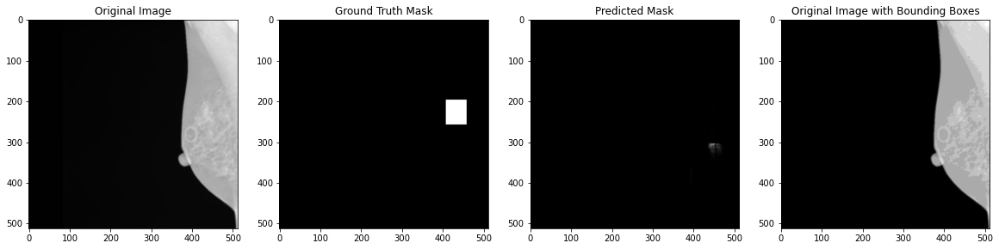

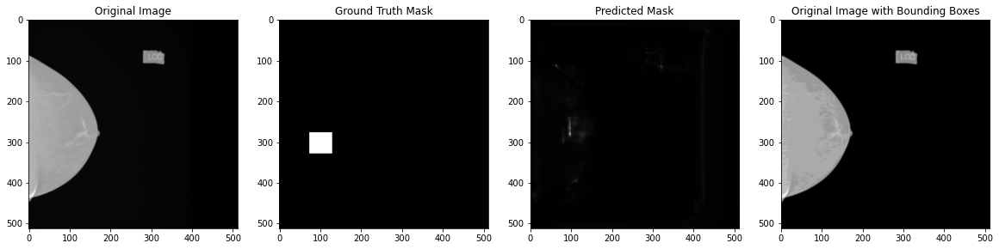

...

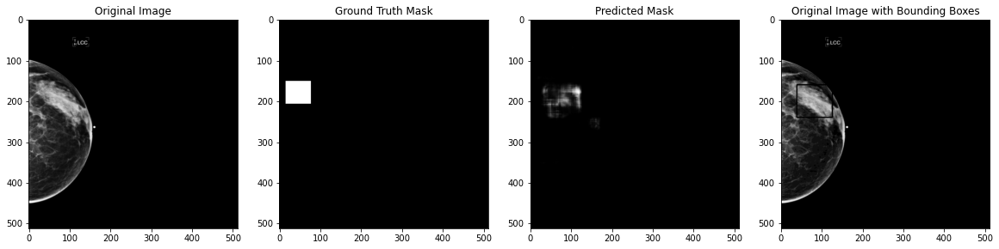

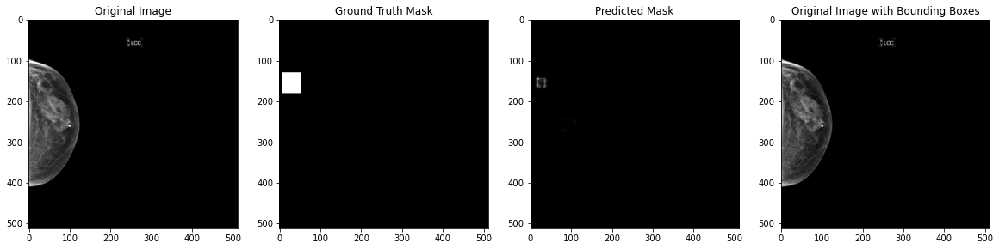

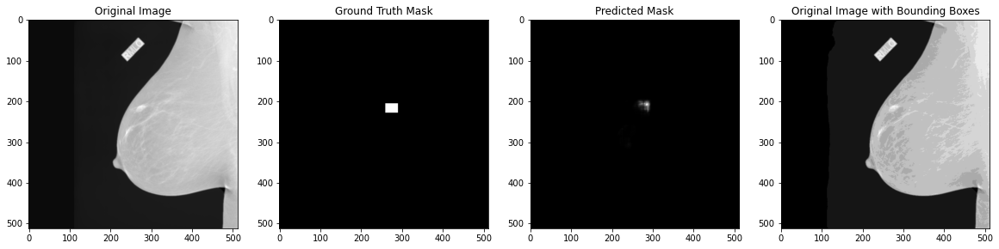

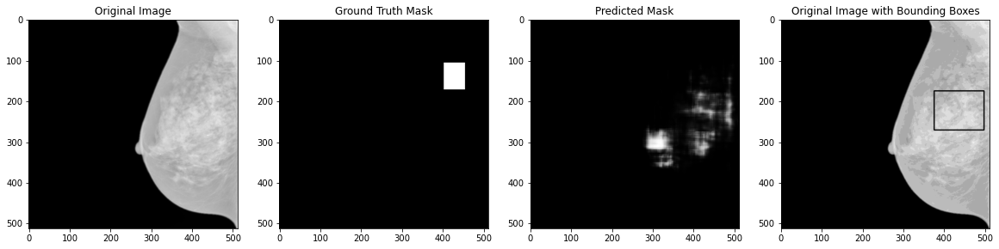

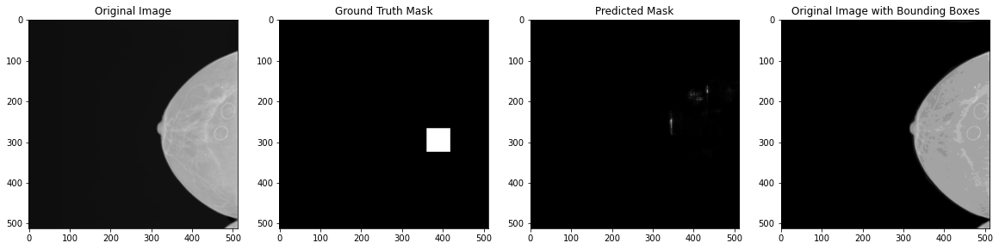

  0%|          | 0/63 [00:00<?, ?it/s]

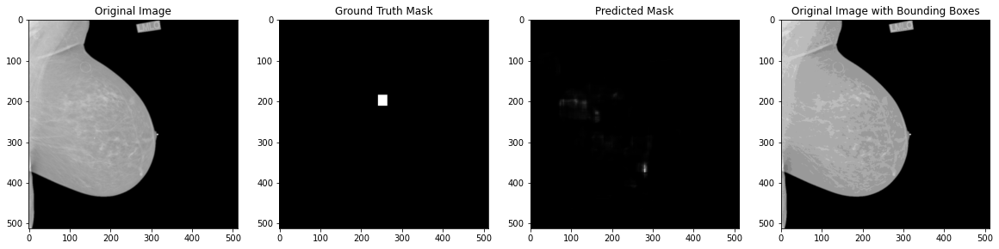

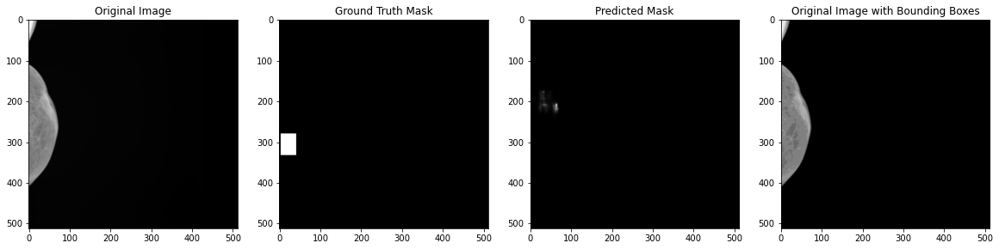

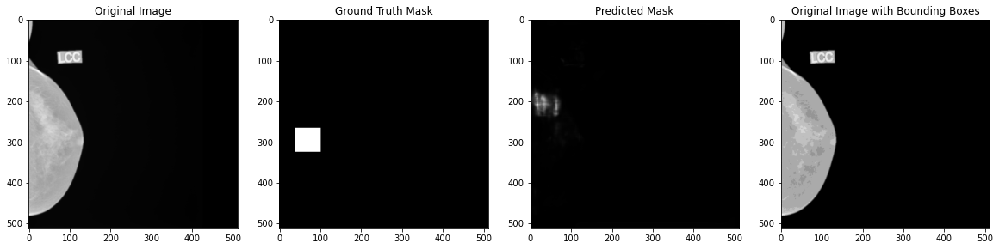

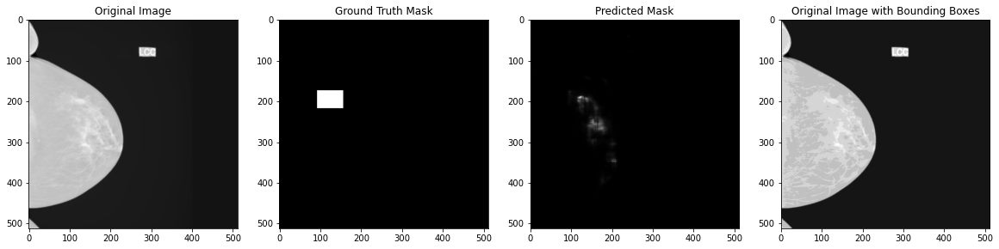

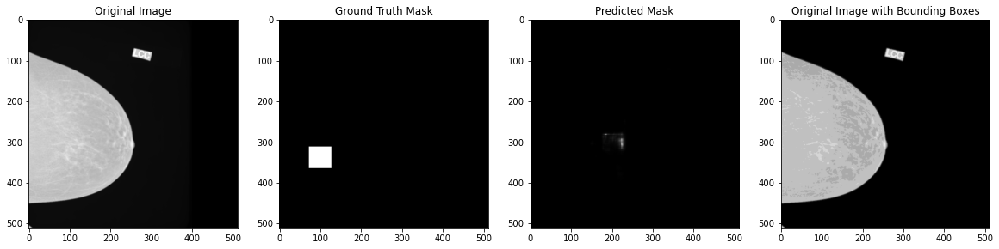

...

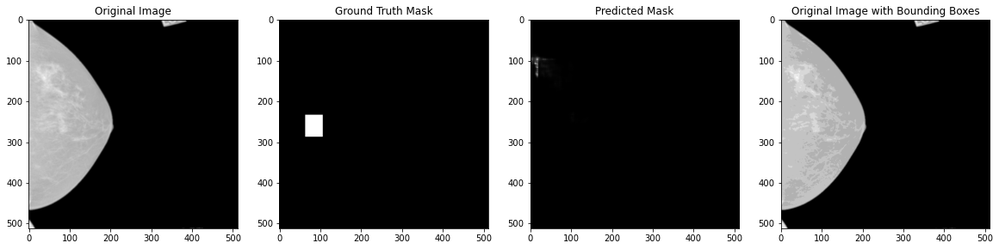

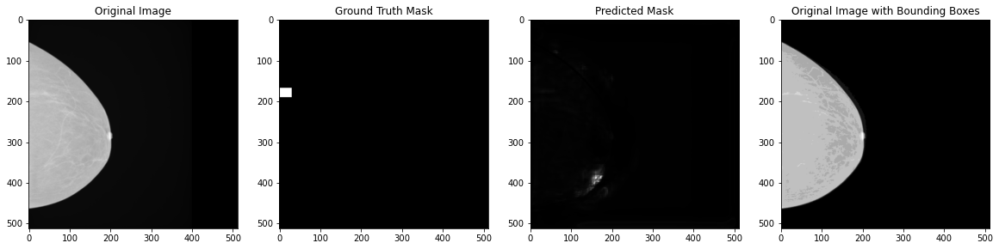

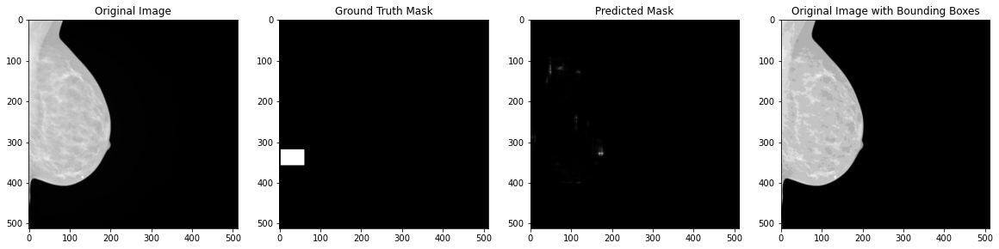

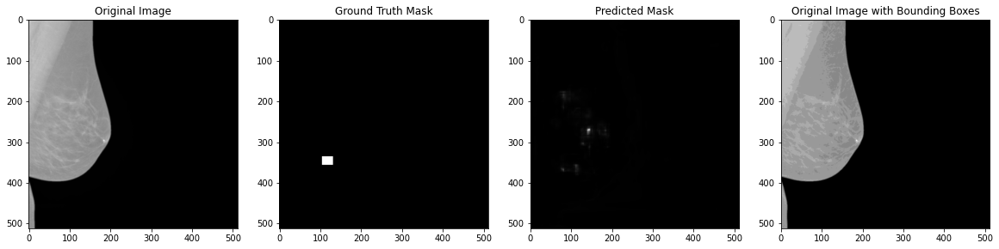

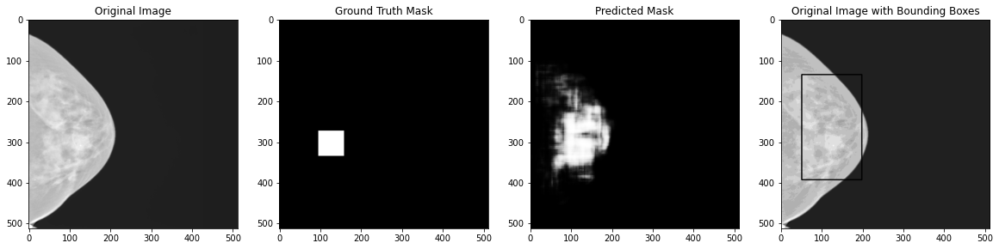

  0%|          | 0/63 [00:00<?, ?it/s]

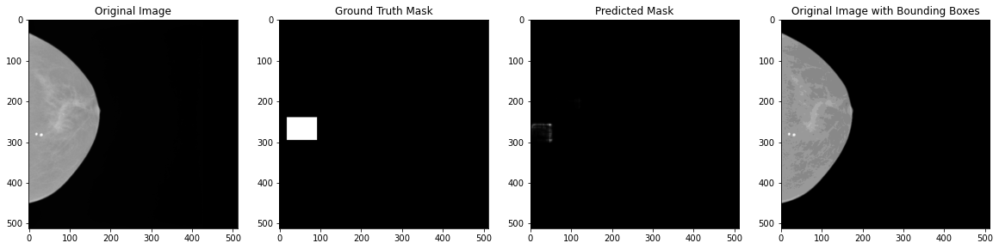

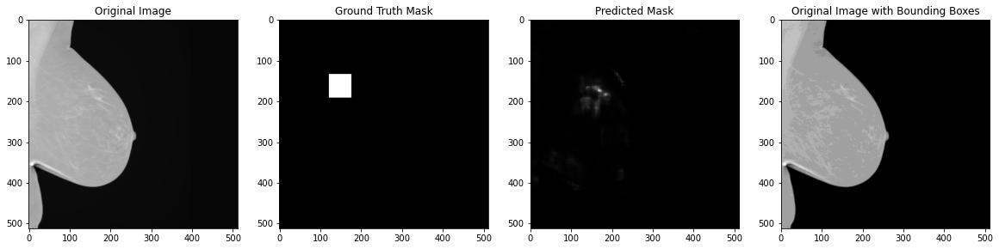

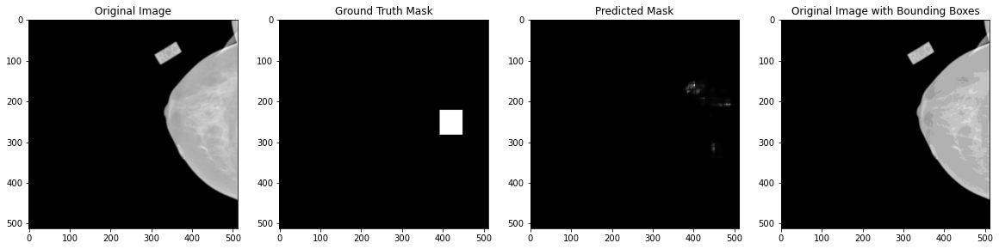

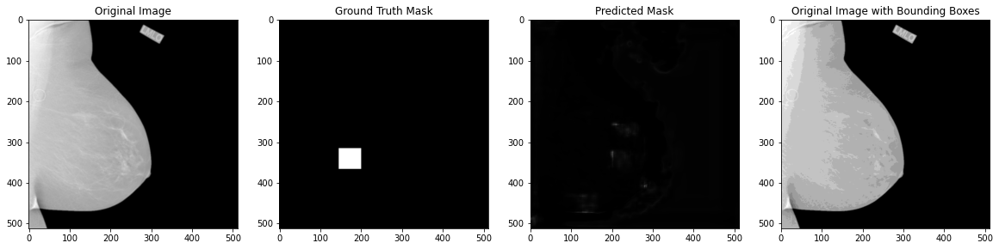

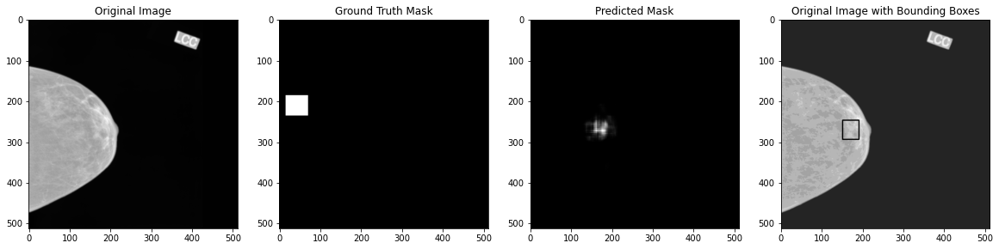

...

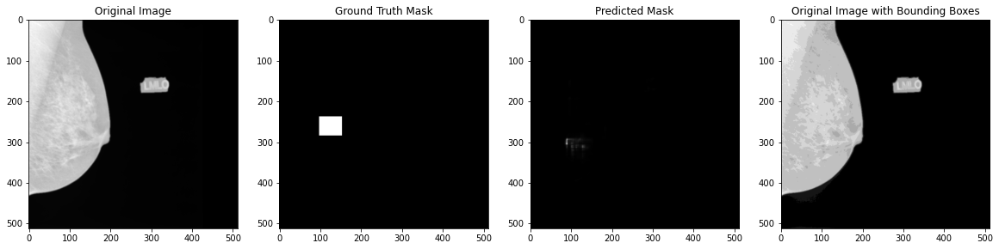

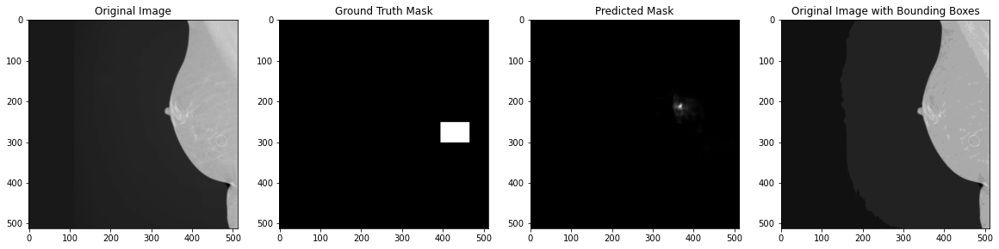

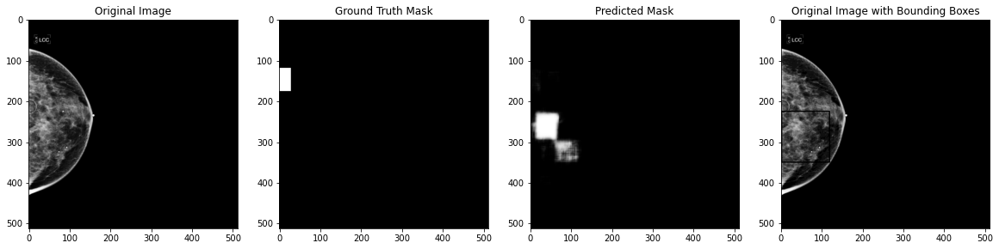

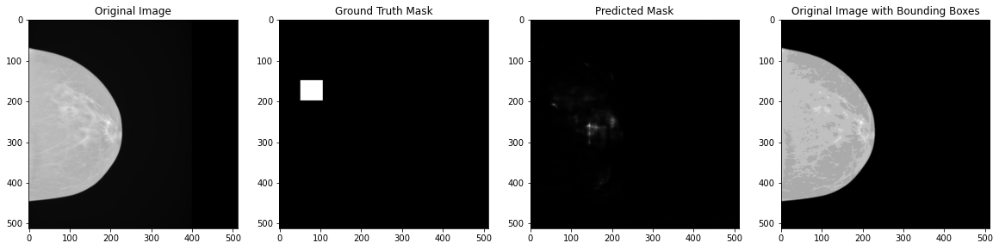

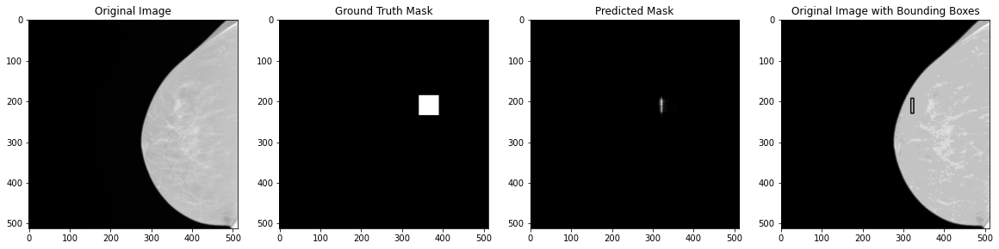

  0%|          | 0/63 [00:00<?, ?it/s]

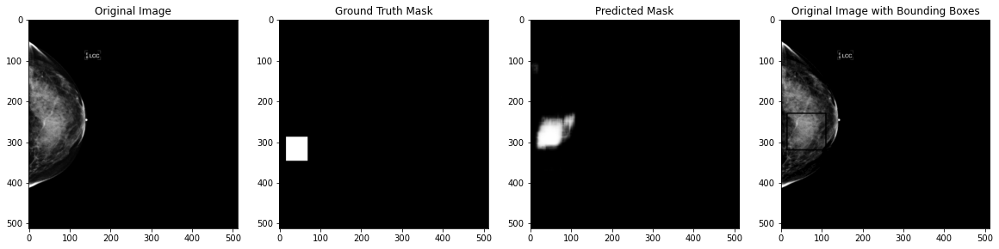

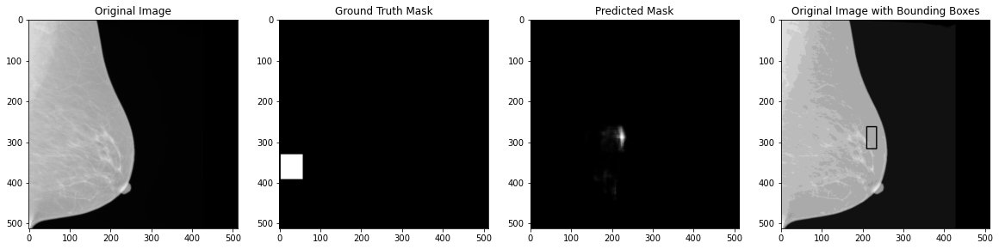

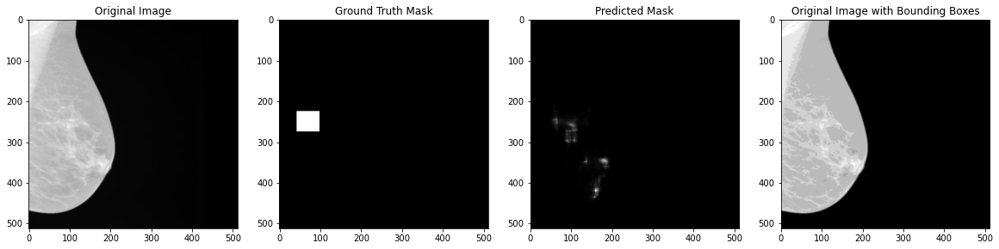

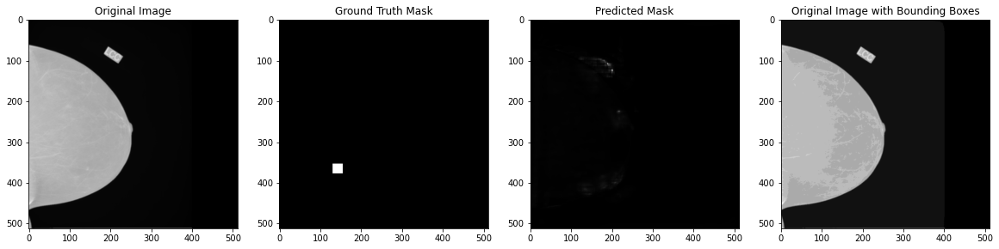

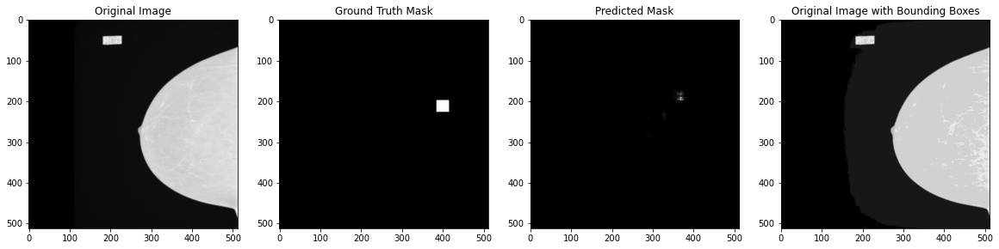

...

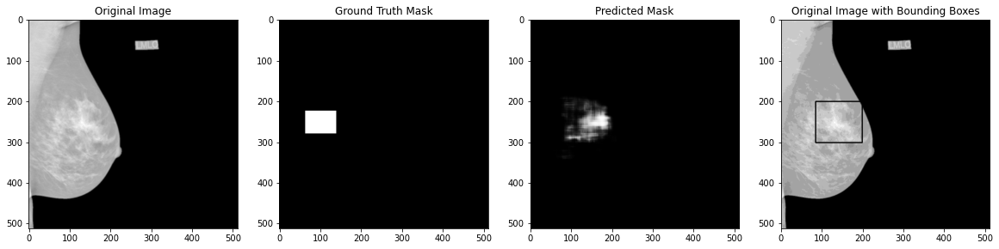

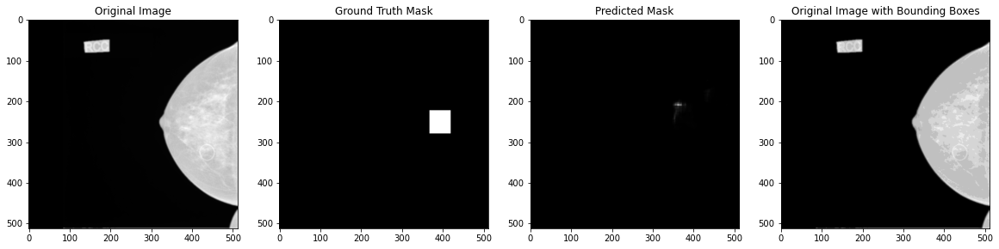

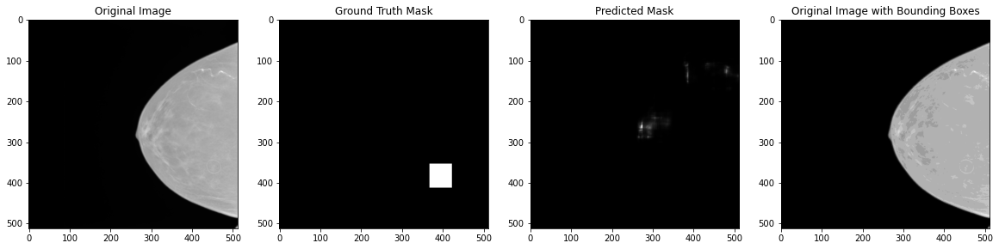

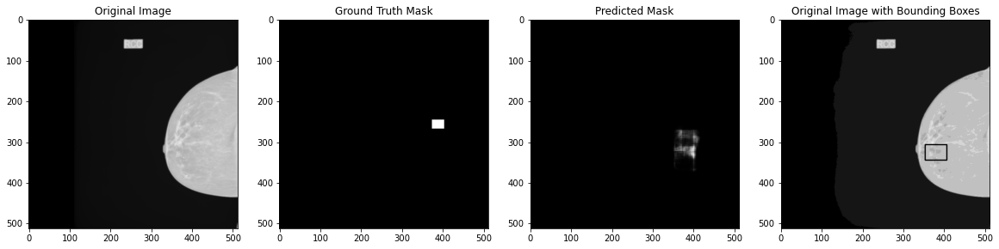

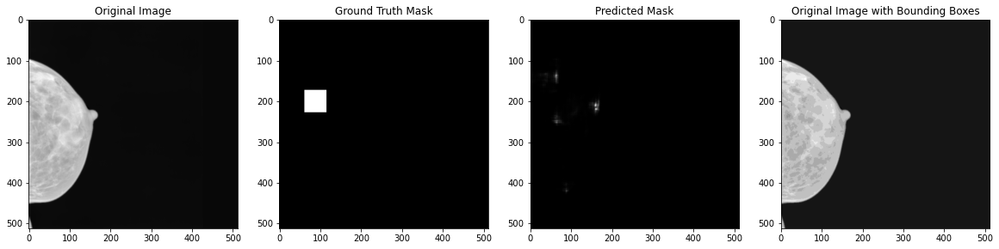

  0%|          | 0/63 [00:00<?, ?it/s]

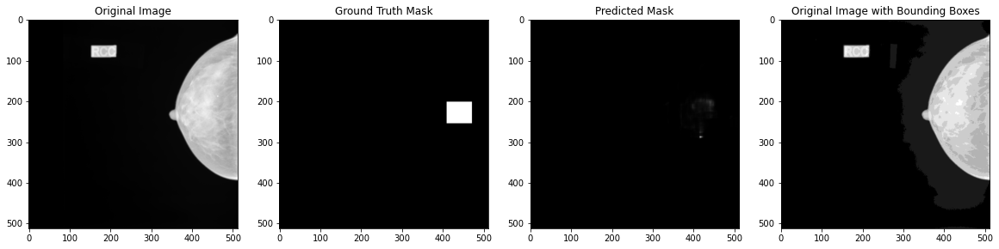

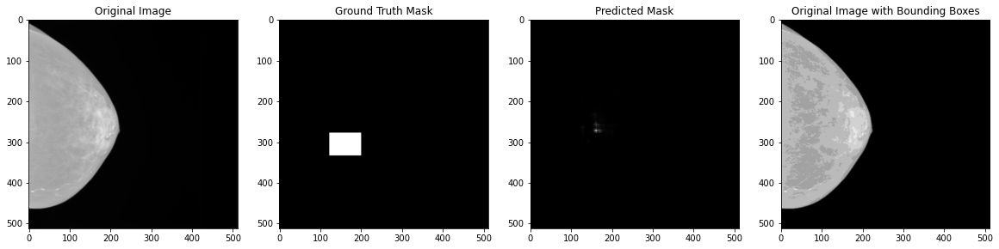

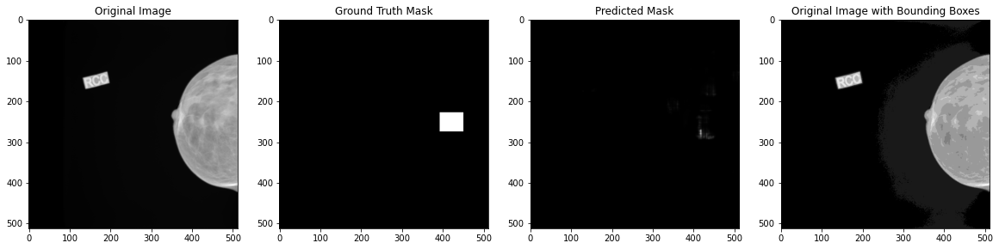

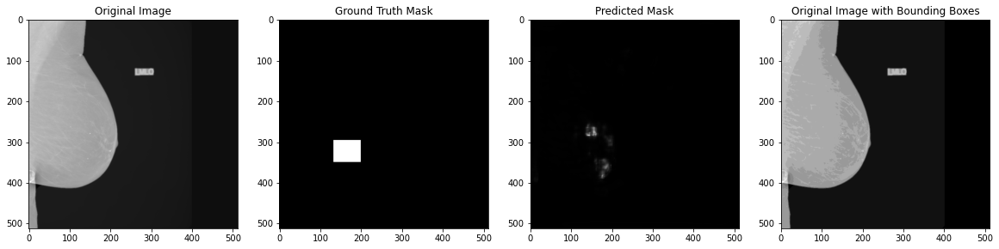

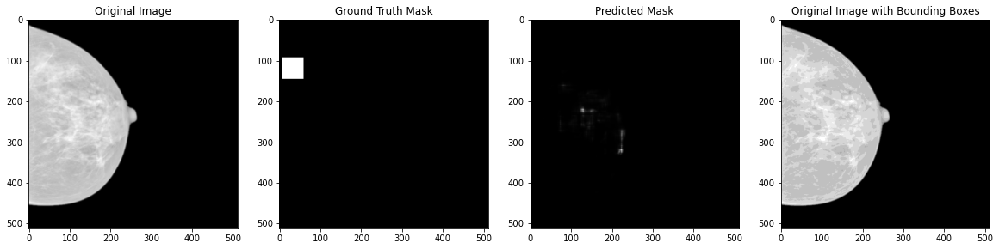

...

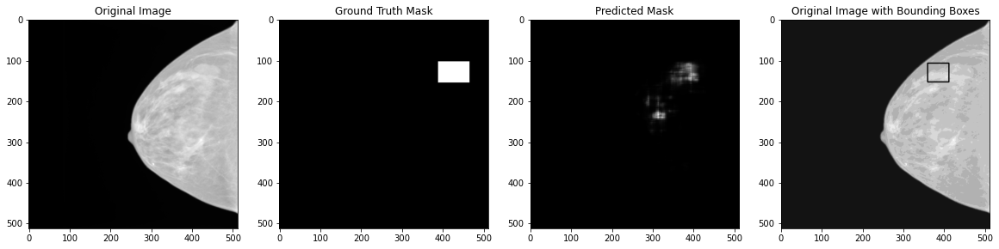

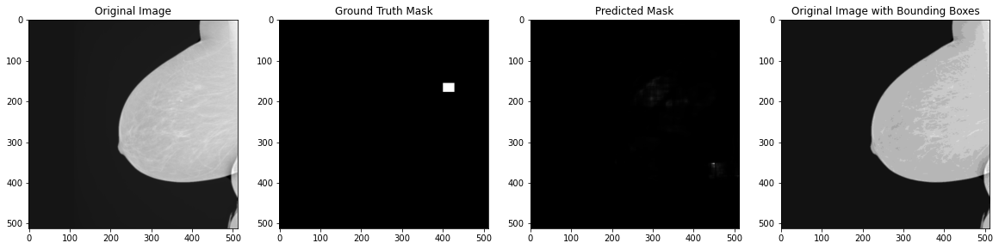

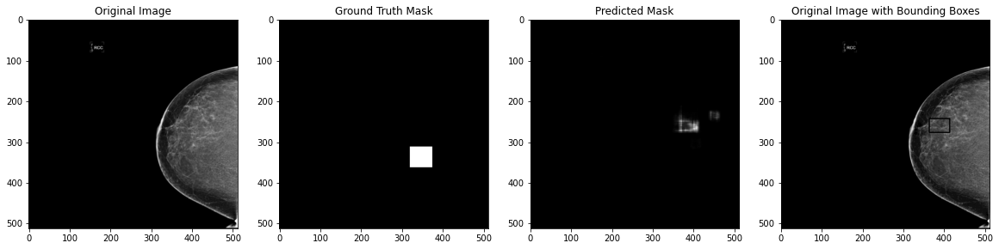

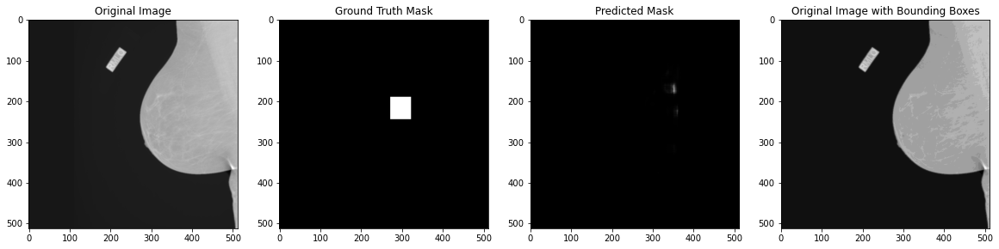

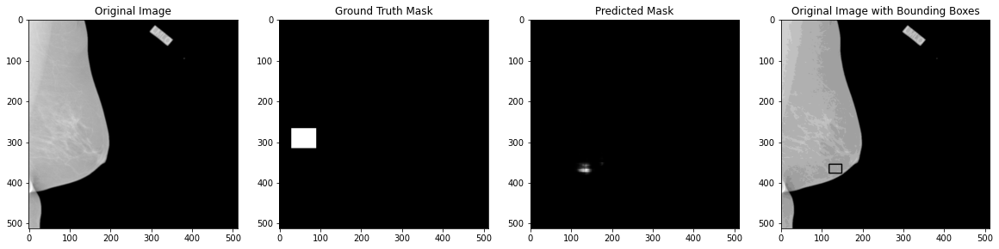

  0%|          | 0/63 [00:00<?, ?it/s]

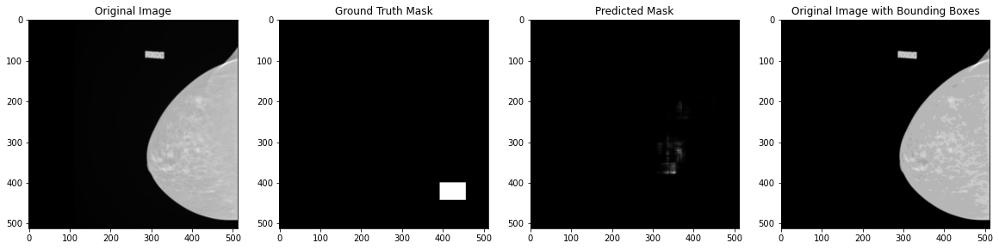

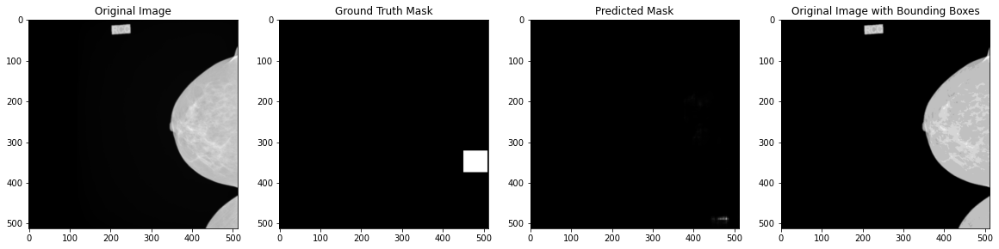

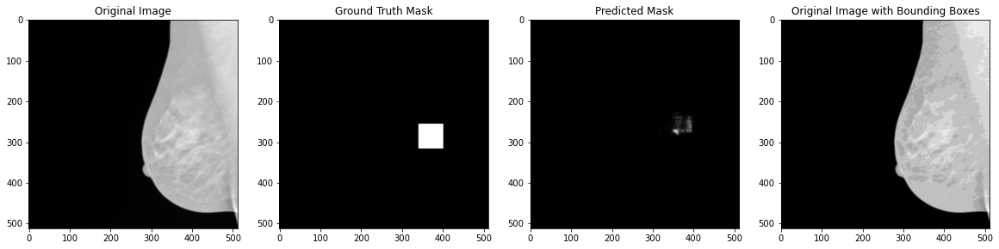

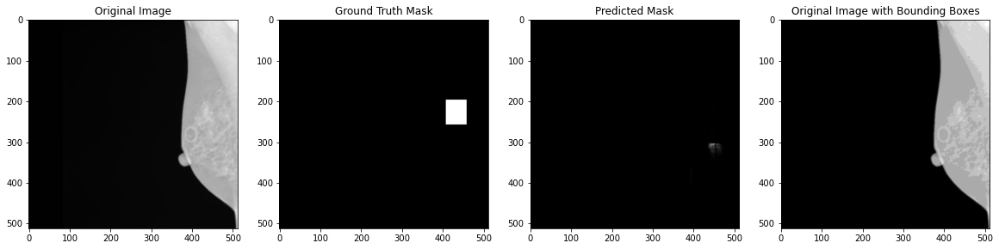

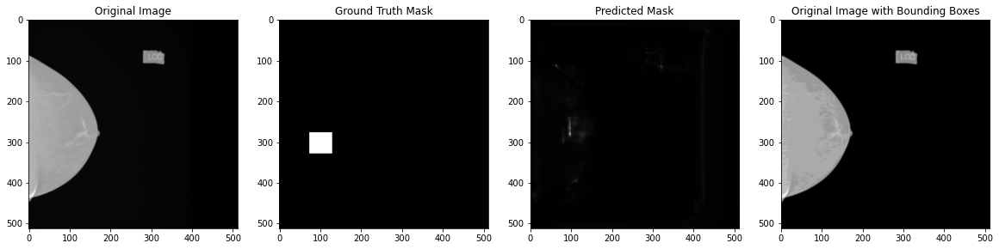

...

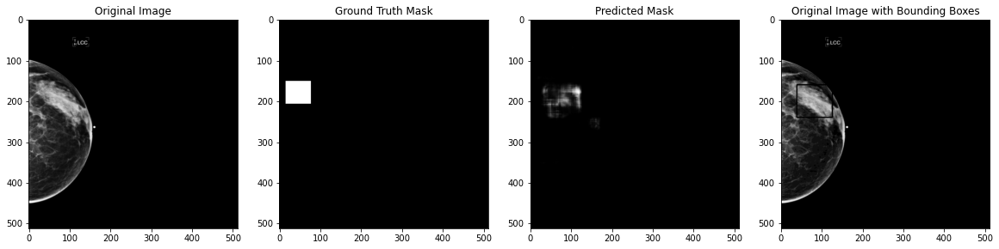

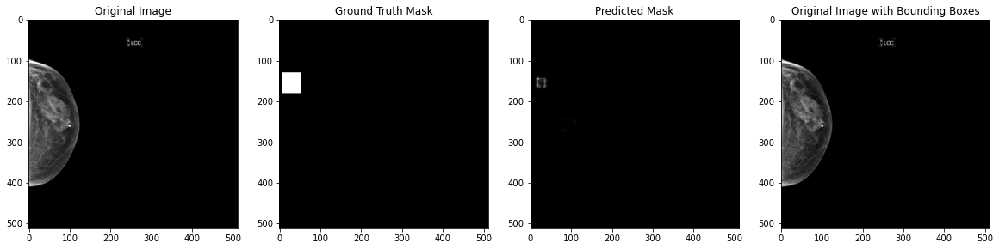

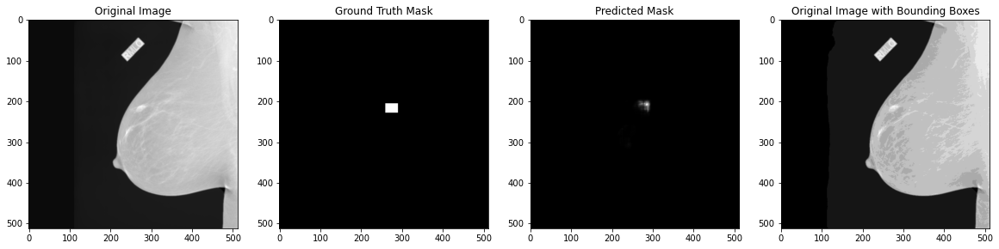

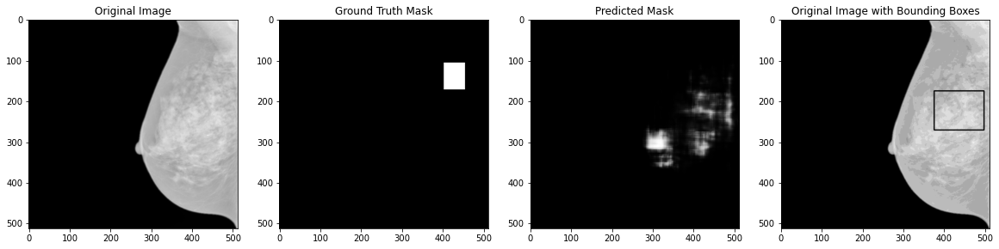

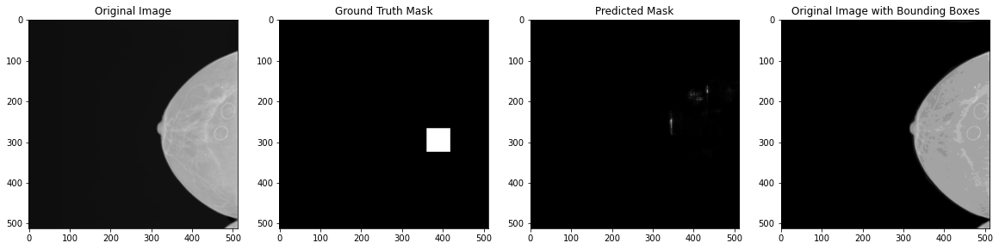

  0%|          | 0/63 [00:00<?, ?it/s]

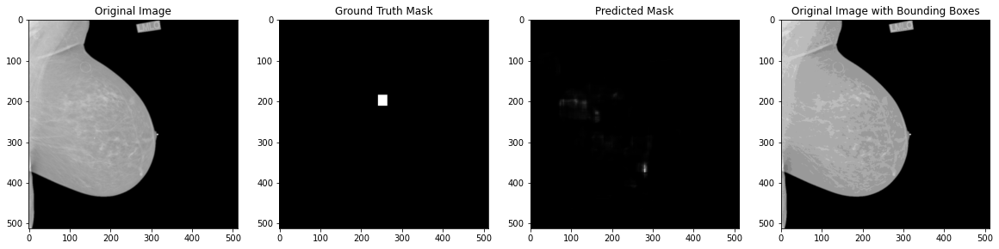

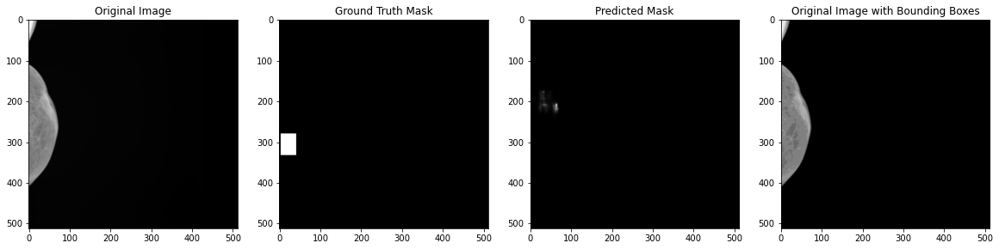

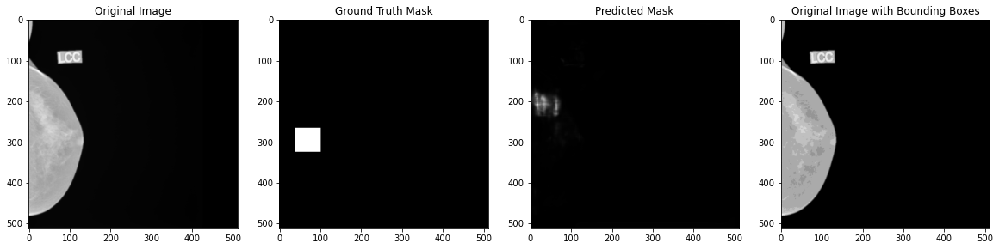

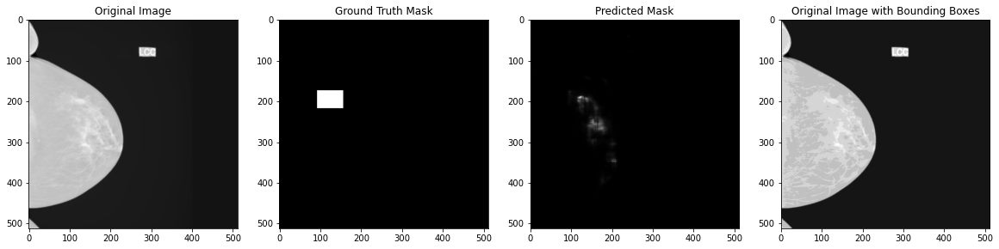

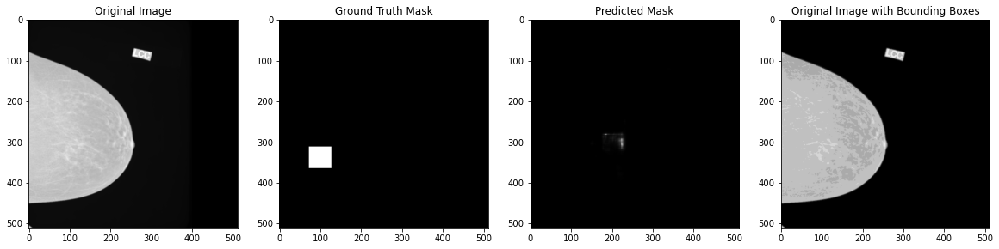

...

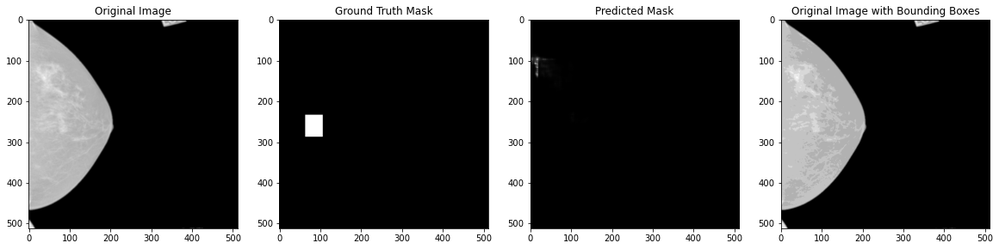

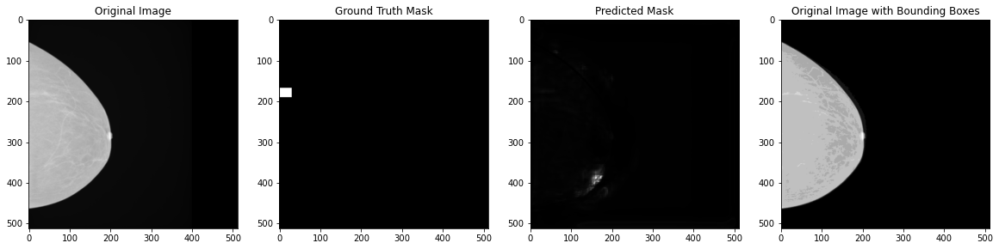

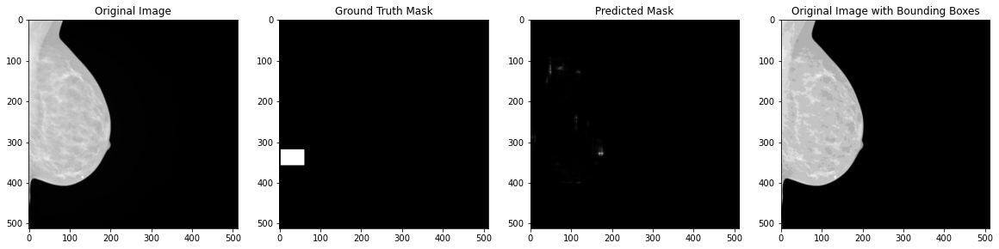

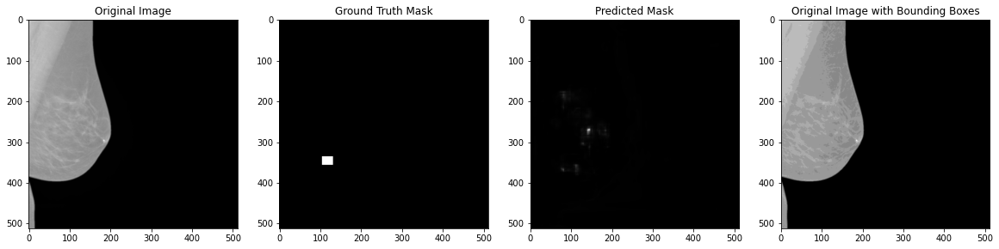

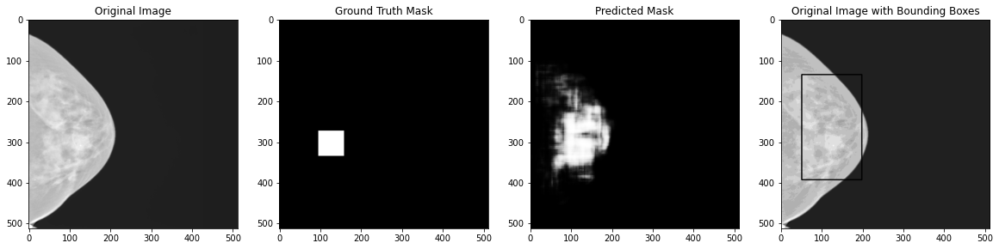

  0%|          | 0/63 [00:00<?, ?it/s]

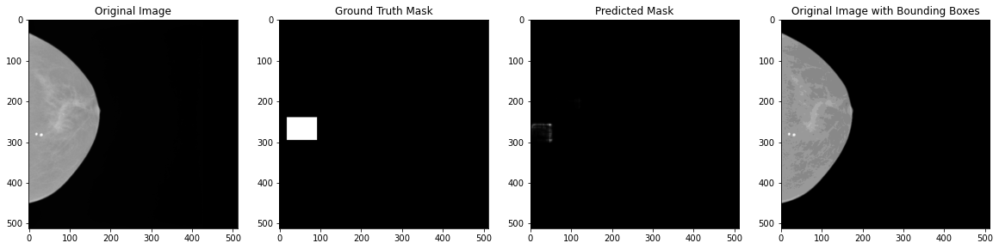

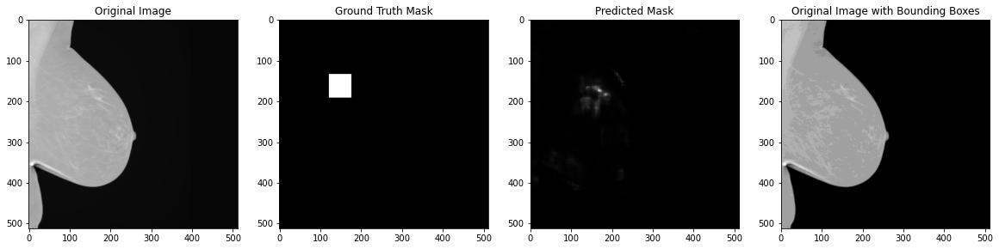

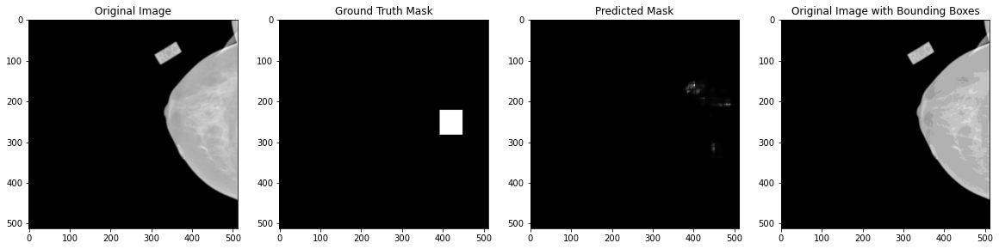

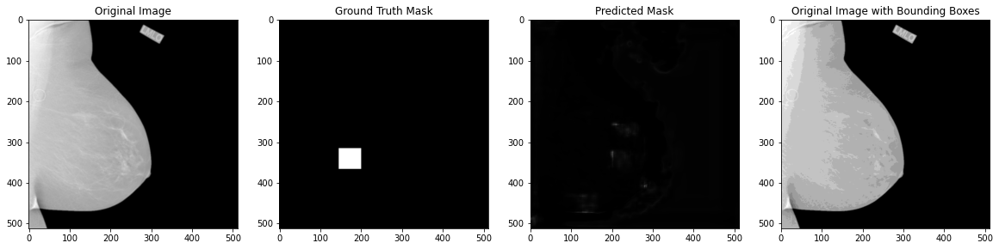

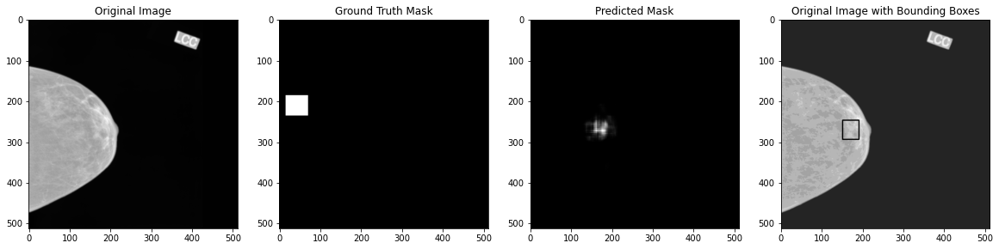

...

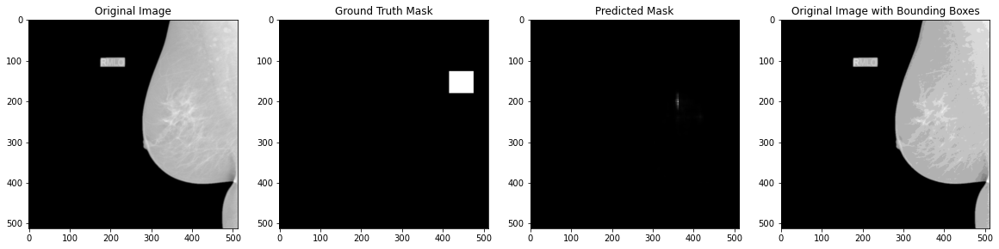

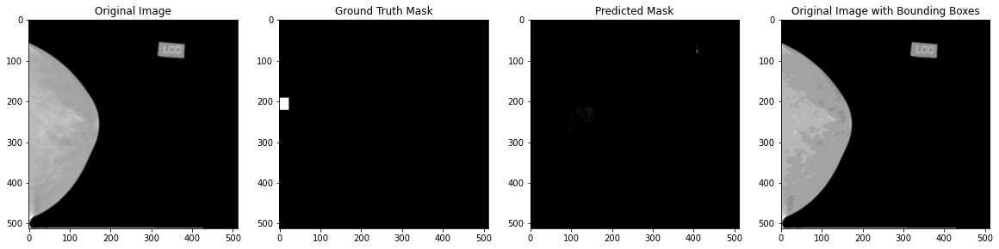

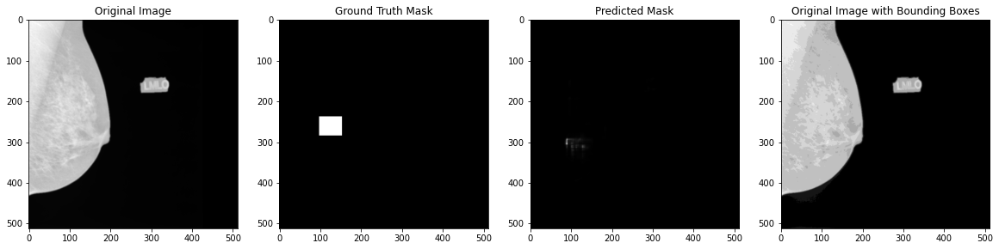

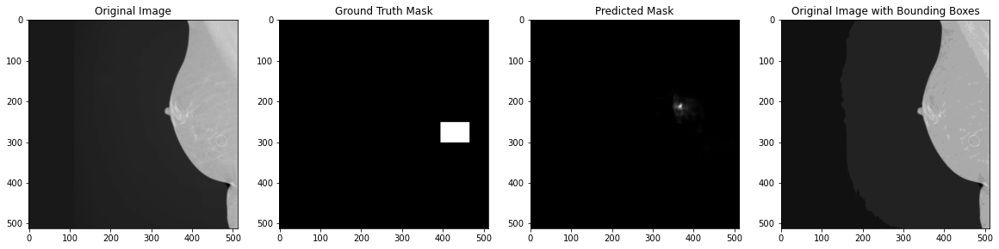

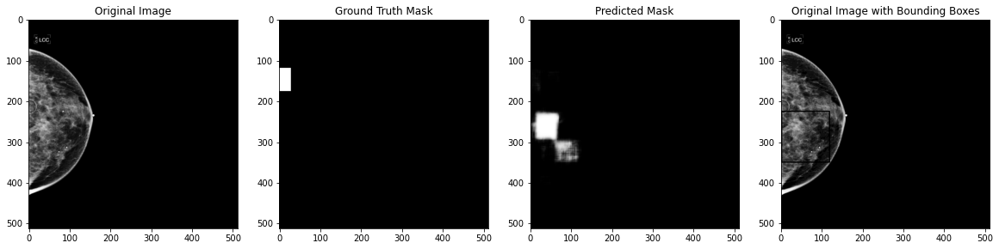

In [16]:
# Initialize progress bar and storage list
all_predictions = []

test_steps = 1000  # or whatever number of steps you want to visualize

# Initialize the TQDM progress bar
with tqdm(total=test_steps, dynamic_ncols=True) as pbar:
    for i in range(test_steps):
        batch_data, ground_truth_masks = next(test_generator)

        # Make predictions
        predicted_masks = model.predict(batch_data, verbose=0)

        # Convert prediction to uint8 and threshold
        mask_uint8 = (np.squeeze(predicted_masks[0]) * 255).astype(np.uint8)

        # Append predictions to all_predictions list
        all_predictions.append(predicted_masks)

        # Update progress bar
        pbar.update(1)

        # For demonstration, let's visualize the first image in the batch
        if i % 5 == 0:  # Adjust this frequency as needed
            plt.figure(figsize=(20, 5))

            # Plot original image
            plt.subplot(1, 4, 1)
            plt.title('Original Image')
            plt.imshow(np.squeeze(batch_data[0]), cmap='gray')

            # Plot ground truth mask
            plt.subplot(1, 4, 2)
            plt.title('Ground Truth Mask')
            plt.imshow(np.squeeze(ground_truth_masks[0]), cmap='gray')

            # Plot predicted mask
            plt.subplot(1, 4, 3)
            plt.title('Predicted Mask')
            plt.imshow(np.squeeze(predicted_masks[0]), cmap='gray')

            # Draw bounding boxes on the original image using the predicted mask
            original_image_with_boxes = get_and_draw_bounding_boxes(mask_uint8, np.squeeze(batch_data[0]).astype(np.uint8))

            # Plot original image with bounding boxes
            plt.subplot(1, 4, 4)
            plt.title('Original Image with Bounding Boxes')
            plt.imshow(original_image_with_boxes, cmap='gray')

            plt.show()

In [ ]:
# from matplotlib import pyplot as plt
# import numpy as np

# # Initialize progress bar and storage list
# all_predictions = []

# test_steps = 1000


# with tqdm(total=test_steps, dynamic_ncols=True) as pbar:
#     for i in range(test_steps):
#         batch_data, ground_truth_masks = next(test_generator)
        
#         # Make predictions
#         predicted_masks = model.predict(batch_data, verbose=0)
        
#         # Append predictions to all_predictions list
#         all_predictions.append(predicted_masks)
        
#         # Update progress bar
#         pbar.update(1)
        
#         # For demonstration, let's visualize the first image in the batch
#         if i % 5 == 0:  # Adjust this frequency as needed
#             plt.figure(figsize=(15, 5))
            
#             # Plot original image
#             plt.subplot(1, 3, 1)
#             plt.title('Original Image')
#             plt.imshow(np.squeeze(batch_data[0]), cmap='gray')
            
#             # Plot ground truth mask
#             plt.subplot(1, 3, 2)
#             plt.title('Ground Truth Mask')
#             plt.imshow(np.squeeze(ground_truth_masks[0]), cmap='gray')
            
#             # Plot predicted mask
#             plt.subplot(1, 3, 3)
#             plt.title('Predicted Mask')
#             plt.imshow(np.squeeze(predicted_masks[0]), cmap='gray')
            
#             plt.show()
